![lop](../../images/logo_diive1_128px.png)

<span style='font-size:40px; display:block;'>
<b>
    Flux Processing Chain
</b>
</span>

---
**Notebook version**: `4.1` (31 Oct 2023)  
**Author**: Lukas Hörtnagl (holukas@ethz.ch)  

</br>

# **Background**

- This notebook demonstrates part of the flux post-processing used for fluxes from Swiss FluxNet research stations
- For a description of the different flux levels, see [Flux Processing Chain](https://www.swissfluxnet.ethz.ch/index.php/data/ecosystem-fluxes/flux-processing-chain/)
- Flux calculations (Level-1) were done in a previous step
- This notebook uses the calculated fluxes (Level-1) and applies several post-processing steps:
    - Quality flag extension (Level-2)
    - Storage correction (Level-3.1)
    - Outlier removel (Level-3.2)
- Other flux levels are currently not produced in this example:
    - Gap-filling (Level-4.1)
    - NEE Partitioning (Level-4.2)

</br>

# **User settings**
`FLUXVAR` is the name of the flux variable in the data files. In the EddyPro `_fluxnet_` output files, the flux variables we primarily use are:
  - `FC` ... CO2 flux, becomes `NEE` after storage correction (Level-3.1)
  - `LE` ... Latent heat flux (water)
  - `H` ... Sensible heat flux
  
There are more flux variables in the output file, but we rarely need them:
  - `FH2O` ... H2O flux, very important but it is the same as `ET` and `LE` but with different units
  - `ET` ... Evapotranspiration, very important but it is the same as `FH2O` and `LE` but with different units. We can easily calculte `ET` later from `LE`, e.g. in `ReddyProc`.
  - `TAU` ... Momentum flux, a measure of the turbulent transfer of momentum between the land surface and the atmosphere

In [1]:
FLUXVAR = "FC"  # Name of the flux variable: FC (CO2 flux), LE (latent heat, water) of H (sensible heat)
FOLDERS = [r"L:\Sync\luhk_work\CURRENT\fru\Level-1_results_fluxnet_2020-2022"]  # Folders where data files are located, in case you want to load data from these files
SITE_LAT = 46.815333  # Latitude of site
SITE_LON = 9.855972  # Longitude of site

</br>

# **Imports**
- This notebook uses `diive` ([source code](https://gitlab.ethz.ch/diive/diive)) to check eddy covariance fluxes for quality

In [82]:
import os
import importlib.metadata
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from pathlib import Path
from diive.core.io.filereader import MultiDataFileReader, search_files
from diive.core.io.files import save_parquet, load_parquet
from diive.core.times.times import TimestampSanitizer
from diive.pkgs.fluxprocessingchain.level2_qualityflags import FluxQualityFlagsLevel2EddyPro
from diive.pkgs.fluxprocessingchain.level31_storagecorrection import FluxStorageCorrectionSinglePointEddyPro
from diive.pkgs.outlierdetection.stepwiseoutlierdetection import StepwiseOutlierDetection
from diive.pkgs.qaqc.qcf import FlagQCF
from diive.core.plotting.timeseries import TimeSeries  # For simple (interactive) time series plotting
from diive.core.dfun.stats import sstats  # Time series stats

version_diive = importlib.metadata.version("diive")
print(f"diive version: v{version_diive}")

diive version: v0.65.0


</br>

# **Docstring** for `FluxQualityFlagsLevel2EddyPro`

In [3]:
help(FluxQualityFlagsLevel2EddyPro)

Help on class FluxQualityFlagsLevel2EddyPro in module diive.pkgs.fluxprocessingchain.level2_qualityflags:

class FluxQualityFlagsLevel2EddyPro(builtins.object)
 |  FluxQualityFlagsLevel2EddyPro(df: pandas.core.frame.DataFrame, fluxcol: str, levelid: str = 'L2')
 |  
 |  Create QCF (quality-control flag) for selected flags, calculated
 |  from EddyPro's _fluxnet_ output files
 |  
 |  Methods defined here:
 |  
 |  __init__(self, df: pandas.core.frame.DataFrame, fluxcol: str, levelid: str = 'L2')
 |      Create QCF (quality-control flag) for selected flags, calculated
 |      from EddyPro's _fluxnet_ output files
 |      
 |      Args:
 |          df: Dataframe containing data from EddyPro's _fluxnet_ file
 |          fluxcol: Name of the flux variable in *df*
 |          levelid: Suffix added to output variable names
 |  
 |  angle_of_attack_test(self)
 |      Flag from EddyPro fluxnet files is an integer and looks like this, e.g.: 81
 |      The integer contains angle-of-attack test r

</br>

# **Docstring** for `FluxStorageCorrectionSinglePointEddyPro`

In [4]:
help(FluxStorageCorrectionSinglePointEddyPro)

Help on class FluxStorageCorrectionSinglePointEddyPro in module diive.pkgs.fluxprocessingchain.level31_storagecorrection:

class FluxStorageCorrectionSinglePointEddyPro(builtins.object)
 |  FluxStorageCorrectionSinglePointEddyPro(df: pandas.core.frame.DataFrame, fluxcol: str, levelid: str = 'L3.1')
 |  
 |  Estimation of storage fluxes (gases, sensible heat, latent heat) from concentrations
 |  (1-point profile) as calculated by EddyPro
 |  
 |  Methods defined here:
 |  
 |  __init__(self, df: pandas.core.frame.DataFrame, fluxcol: str, levelid: str = 'L3.1')
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  get(self) -> pandas.core.frame.DataFrame
 |      Return original data with storage-corrected flux and the flag
 |      indicating storage term availability
 |  
 |  report(self)
 |  
 |  showplot(self, maxflux: float)
 |  
 |  storage_correction(self)
 |  
 |  ----------------------------------------------------------------------
 |  Readonly propertie

</br>

# **Docstring** for `StepwiseOutlierDetection`

In [5]:
help(StepwiseOutlierDetection)

Help on class StepwiseOutlierDetection in module diive.pkgs.outlierdetection.stepwiseoutlierdetection:

class StepwiseOutlierDetection(builtins.object)
 |  StepwiseOutlierDetection(dataframe: pandas.core.frame.DataFrame, col: str, site_lat: float, site_lon: float, utc_offset: int)
 |  
 |  Step-wise outlier detection in time series data
 |  
 |  The class is optimized to work in Jupyter notebooks.
 |  
 |  Quality flags that can be directly created via this class:
 |  - `.flag_missingvals_test()`: Generate flag that indicates missing records in data
 |  - `.flag_outliers_abslim_test()`: Generate flag that indicates if values in data are outside the specified range
 |  - `.flag_outliers_abslim_dtnt_test()`: Generate flag that indicates if daytime and nighttime values in data are
 |      outside their respectively specified ranges
 |  - `.flag_outliers_increments_zcore_test()`: Identify outliers based on the z-score of increments
 |  - `.flag_outliers_localsd_test()`: Identify outliers b

</br>

# **Load data** (2 options)

## Option 1: Load data from single or multiple output files
- Used to read data from the EddyPro _fluxnet_ output files

### Search files

In [6]:
filepaths = search_files(FOLDERS, "*.csv")  # Search all CSV files in folder and subfolders and store filepaths in list
filepaths = [fp for fp in filepaths if "eddypro_" in fp.stem and "_fluxnet_" in fp.stem and fp.stem.endswith("_adv")]  # Filter list and keep only EddyPro _fluxnet_ output files
filepaths

[WindowsPath('L:/Sync/luhk_work/CURRENT/fru/Level-1_results_fluxnet_2020-2022/2020_eddypro_CH-FRU_FR-20230425-205325_fluxnet_2023-04-26T220030_adv.csv'),
 WindowsPath('L:/Sync/luhk_work/CURRENT/fru/Level-1_results_fluxnet_2020-2022/2021_eddypro_CH-FRU_FR-20230425-205131_fluxnet_2023-04-26T214014_adv.csv'),
 WindowsPath('L:/Sync/luhk_work/CURRENT/fru/Level-1_results_fluxnet_2020-2022/2022_eddypro_CH-FRU_FR-20230425-205042_fluxnet_2023-04-26T222351_adv.csv')]

### Read Files

In [7]:
data = MultiDataFileReader(filetype='EDDYPRO_FLUXNET_30MIN', filepaths=filepaths)
df_orig = data.data_df.copy()

Reading file 2020_eddypro_CH-FRU_FR-20230425-205325_fluxnet_2023-04-26T220030_adv.csv ...
Reading file 2021_eddypro_CH-FRU_FR-20230425-205131_fluxnet_2023-04-26T214014_adv.csv ...
Reading file 2022_eddypro_CH-FRU_FR-20230425-205042_fluxnet_2023-04-26T222351_adv.csv ...


</br>

## Option 2: Load data from `parquet` file
- Used to continue a previous session where another flux variable was already post-processed
- For example, if you have already post-processed CO2 flux and now want to post-process H2O flux
- Also detects time resolution of time series, this info was lost when saving to the parquet file

In [ ]:
df_orig = load_parquet(filepath='df_level32_qcf.parquet')

</br>

## Check data

In [8]:
df_orig

,AIR_MV,AIR_DENSITY,AIR_RHO_CP,AIR_CP,AOA_METHOD,AXES_ROTATION_METHOD,BOWEN,BURBA_METHOD,BADM_LOCATION_LAT,BADM_LOCATION_LONG,BADM_LOCATION_ELEV,BADM_HEIGHTC,BADM_INST_SAMPLING_INT,BADM_INST_AVERAGING_INT,BADM_INST_MODEL_SA,...,W_T_SONIC_COV_IBROM_N0004,W_NUM_SPIKES,WD_FILTER_NREX,W_SPIKE_NREX,W_ABSLIM_NREX,W_VM97_TEST,W_LGD,W_KID,W_ZCD,W_ITC,W_ITC_TEST,WBOOST_APPLIED,WPL_APPLIED,ZL,ZL_UNCORR
TIMESTAMP_MIDDLE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-12-31 19:15:00,0.024907,1.16085,1169.83,1007.74,0.0,1.0,5.765210,0.0,47.1158,8.53778,982.0,0.4,20.0,30.0,NaN,...,-0.003629,3.0,0.0,5.0,0.0,800000011.0,0.0,6.40148,630.0,6.0,1.0,0.0,1.0,3.079130,3.006370
2019-12-31 19:45:00,0.024865,1.16271,1171.77,1007.79,0.0,1.0,1.627180,0.0,47.1158,8.53778,982.0,0.4,20.0,30.0,NaN,...,0.002473,0.0,0.0,0.0,0.0,800000011.0,0.0,7.97684,255.0,47.0,3.0,0.0,1.0,-0.096300,-0.099549
2019-12-31 20:15:00,0.024910,1.16061,1169.68,1007.81,0.0,1.0,-5.226190,0.0,47.1158,8.53778,982.0,0.4,20.0,30.0,NaN,...,0.018346,6.0,0.0,9.0,0.0,800000111.0,0.0,8.32701,470.0,27.0,2.0,0.0,1.0,-0.780695,-0.771121
2019-12-31 20:45:00,0.024886,1.16183,1170.78,1007.70,0.0,1.0,2.296260,0.0,47.1158,8.53778,982.0,0.4,20.0,30.0,NaN,...,-0.001395,5.0,0.0,9.0,0.0,800000011.0,0.0,8.49884,514.0,21.0,2.0,0.0,1.0,0.540130,0.545173
2019-12-31 21:15:00,0.024874,1.16239,1171.37,1007.73,0.0,1.0,-0.195424,0.0,47.1158,8.53778,982.0,0.4,20.0,30.0,NaN,...,0.005141,4.0,0.0,5.0,0.0,800000111.0,0.0,11.34600,266.0,9.0,1.0,0.0,1.0,-0.135396,-0.095764
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 22:45:00,0.025906,1.11442,1125.59,1010.02,0.0,1.0,-3.645490,0.0,47.1158,8.53778,982.0,0.4,20.0,30.0,NaN,...,-0.000189,13.0,0.0,22.0,0.0,800001101.0,0.0,23.89100,424.0,9.0,1.0,0.0,1.0,0.316949,0.309181
2022-12-31 23:15:00,0.025770,1.12033,1131.50,1009.97,0.0,1.0,-1.667900,0.0,47.1158,8.53778,982.0,0.4,20.0,30.0,NaN,...,0.005310,4.0,0.0,7.0,0.0,800000011.0,0.0,10.83960,1305.0,60.0,4.0,0.0,1.0,-0.057874,-0.056127
2022-12-31 23:45:00,0.025757,1.12077,1132.08,1010.09,0.0,1.0,61.622800,0.0,47.1158,8.53778,982.0,0.4,20.0,30.0,NaN,...,-0.030341,4.0,0.0,6.0,0.0,800000111.0,0.0,10.21180,822.0,8.0,1.0,0.0,1.0,1.716370,1.677440


In [9]:
df_orig.describe()

,AIR_MV,AIR_DENSITY,AIR_RHO_CP,AIR_CP,AOA_METHOD,AXES_ROTATION_METHOD,BOWEN,BURBA_METHOD,BADM_LOCATION_LAT,BADM_LOCATION_LONG,BADM_LOCATION_ELEV,BADM_HEIGHTC,BADM_INST_SAMPLING_INT,BADM_INST_AVERAGING_INT,BADM_INST_MODEL_SA,...,W_T_SONIC_COV_IBROM_N0004,W_NUM_SPIKES,WD_FILTER_NREX,W_SPIKE_NREX,W_ABSLIM_NREX,W_VM97_TEST,W_LGD,W_KID,W_ZCD,W_ITC,W_ITC_TEST,WBOOST_APPLIED,WPL_APPLIED,ZL,ZL_UNCORR
count,51400.000000,51400.000000,51400.000000,51400.000000,51400.0,51400.0,44095.000000,51400.0,5.140000e+04,5.140000e+04,51400.0,5.140000e+04,51400.0,51400.0,0.0,...,51400.000000,51400.000000,51400.0,51400.000000,51400.0,5.140000e+04,51400.000000,51400.000000,51400.000000,51400.000000,51400.000000,51400.0,51400.0,51400.000000,51400.000000
mean,0.025838,1.117528,1129.686974,1010.944959,0.0,1.0,-0.683604,0.0,4.711580e+01,8.537780e+00,982.0,4.000000e-01,20.0,30.0,NaN,...,0.002956,4.645778,0.0,7.465798,0.0,8.000162e+08,0.021110,10.789163,667.116965,22.000039,1.905545,0.0,1.0,0.009029,-0.006262
std,0.000691,0.031465,29.293703,2.687529,0.0,0.0,141.941398,0.0,1.421099e-14,1.776374e-15,0.0,5.551169e-17,0.0,0.0,NaN,...,0.035587,8.337377,0.0,11.194175,0.0,1.444874e+05,0.474624,30.183355,1148.805515,19.957706,1.039787,0.0,0.0,3.948108,4.775029
min,0.023370,0.742340,749.294000,999.308000,0.0,1.0,-15610.600000,0.0,4.711580e+01,8.537780e+00,982.0,4.000000e-01,20.0,30.0,NaN,...,-1.953460,0.000000,0.0,0.000000,0.0,8.000000e+08,0.000000,3.416780,0.000000,0.000000,1.000000,0.0,1.0,-282.042000,-350.636000
25%,0.025346,1.095490,1109.490000,1008.690000,0.0,1.0,-0.989551,0.0,4.711580e+01,8.537780e+00,982.0,4.000000e-01,20.0,30.0,NaN,...,-0.001838,1.000000,0.0,1.000000,0.0,8.000000e+08,0.000000,7.313835,40.000000,7.000000,1.000000,0.0,1.0,-0.165402,-0.182138
50%,0.025867,1.115520,1127.540000,1010.390000,0.0,1.0,0.064027,0.0,4.711580e+01,8.537780e+00,982.0,4.000000e-01,20.0,30.0,NaN,...,0.001109,3.000000,0.0,5.000000,0.0,8.000000e+08,0.000000,8.741725,225.000000,17.000000,2.000000,0.0,1.0,-0.004058,-0.006488
75%,0.026306,1.139770,1149.990000,1013.070000,0.0,1.0,0.574361,0.0,4.711580e+01,8.537780e+00,982.0,4.000000e-01,20.0,30.0,NaN,...,0.007343,6.000000,0.0,10.000000,0.0,8.000001e+08,0.000000,10.863225,783.000000,32.000000,3.000000,0.0,1.0,0.106186,0.098731
max,0.038901,1.237800,1246.300000,1020.310000,0.0,1.0,15608.100000,0.0,4.711580e+01,8.537780e+00,982.0,4.000000e-01,20.0,30.0,NaN,...,2.760880,588.000000,0.0,592.000000,0.0,8.100111e+08,42.500000,3272.050000,18463.000000,456.000000,7.000000,0.0,1.0,415.217000,570.039000


In [10]:
sstats(df_orig[FLUXVAR])

,FC
STARTDATE,2019-12-31 19:15
ENDDATE,2023-01-01 00:45
PERIOD,1096 days 05:30:00
NOV,46335
MISSING,6285
MISSING_PERC,11.944128
MEAN,-2.353434
SD,22.71197
VAR,515.833587
SD/MEAN,-9.650568


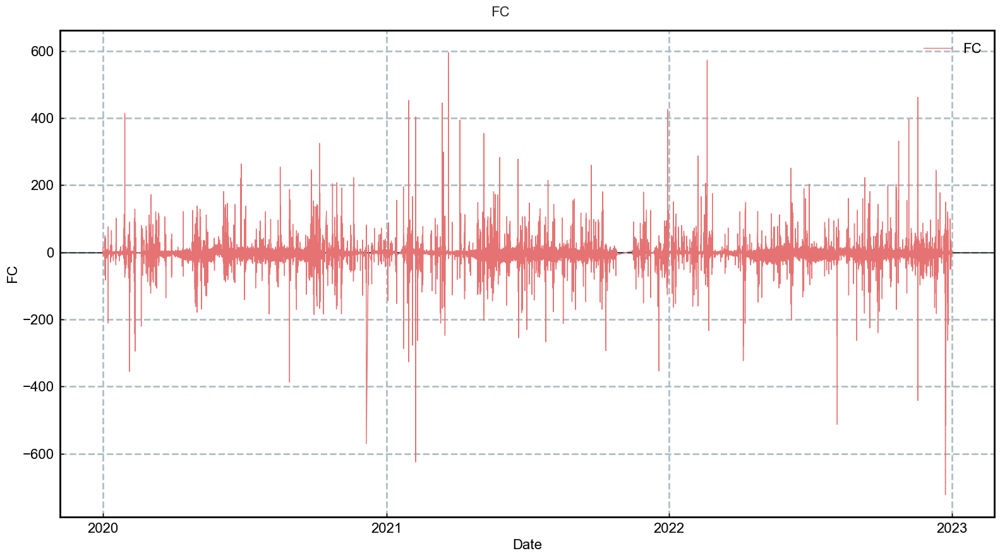

In [11]:
# TimeSeries(series=df_orig[FLUXVAR]).plot_interactive()
TimeSeries(series=df_orig[FLUXVAR]).plot()

</br>

</br>

# **Level-2: Quality flag extension**

> Extract additional quality information from the EddyPro `_fluxnet_` output file and store it in newly added quality flags.



Note that the USTAR filtering is not part of the Level-2 calculations.

</br>

## Inititate calculations

In [12]:
fluxqc = FluxQualityFlagsLevel2EddyPro(fluxcol=FLUXVAR, df=df_orig, levelid='L2')

Detected base variable CO2 for FC.


</br>

</br>

## Flag: **Missing values** test
- Flag calculated here from missing flux values in the EddyPro output file

In [13]:
fluxqc.missing_vals_test()

Generating new flag variable FLAG_L2_FC_MISSING_TEST, newly calculated from output variable FC,with flag 0 (good values) where FC is available, flag 2 (bad values) where FC is missing ...


</br>

</br>

## Flag: **SSITC** tests
- Flag calculated in EddyPro
- Combination of the two partial tests *steady state test* and *developed turbulent conditions test*
- This notebook expects the SSITC flag to follow the flagging policy according to Mauder and Foken 2004: `0` for best quality fluxes, `1` for fluxes suitable for general analysis such as annual
budgets (although this is debatable) and `2` for fluxes that should be discarded from the dataset

In [14]:
fluxqc.ssitc_test()

Generating new flag variable FLAG_L2_FC_SSITC_TEST, values taken from output variable FC_SSITC_TEST ...


</br>

</br>

## Flag: **Completeness** test
- Flag calculated here from the gas number of records percentage in EddyPro output file
- Checks gas number of records available for each averaging Interval

In [15]:
fluxqc.gas_completeness_test()

Generating new flag variable FLAG_L2_FC_COMPLETENESS_TEST, newly calculated from output variable CO2_NR_PERC, with flag 0 (good values) where CO2_NR_PERC >= 0.99, flag 1 (ok values) where CO2_NR_PERC >= 0.97 and < 0.99, flag 2 (bad values) < 0.97...


</br>

</br>

## Flag: **Spectral correction factor** test
- Flag calculated here from the gas `scf` variable in EddyPro output file

In [16]:
fluxqc.spectral_correction_factor_test()

Generating new flag variable FLAG_L2_FC_SCF_TEST, newly calculated from output variable FC_SCF, withflag 0 (good values) where FC_SCF < 2, flag 1 (ok values) where FC_SCF >= 2 and < 4, flag 2 (bad values) where FC_SCF >= 4...


</br>

</br>

## Flag: **Signal strength / AGC** / window dirtiness test (if available)
- Flag calculated here from the signal strength / AGC variable for the gas analyzer in EddyPro output file

<div class="alert alert-block alert-danger">
    <b>Do not use for H (sensible heat flux).</b> This test is only relevant for fluxes where the concentration was measured by a gas analyzer, e.g. FC, FH2O, LE, ET, N2O, CH4, etc ... 
</div>

In [17]:
SIGNAL_STRENGTH_COL = 'CUSTOM_AGC_MEAN'  # Name of the column storing the signal strength, typically 'CUSTOM_AGC_MEAN' for LI-7500, 'CUSTOM_SIGNAL_STRENGTH_IRGA72_MEAN' for LI-7200, or something similar
SIGNAL_STRENGTH_THRESHOLD = 90  # Signal strength threshold, flux values where threshold is exceeded are flagged as rejected
SIGNAL_STRENGTH_METHOD = 'discard above'  # 'discard above' flags fluxes where signal strength > threshold, 'discard below' where signal strength < threshold

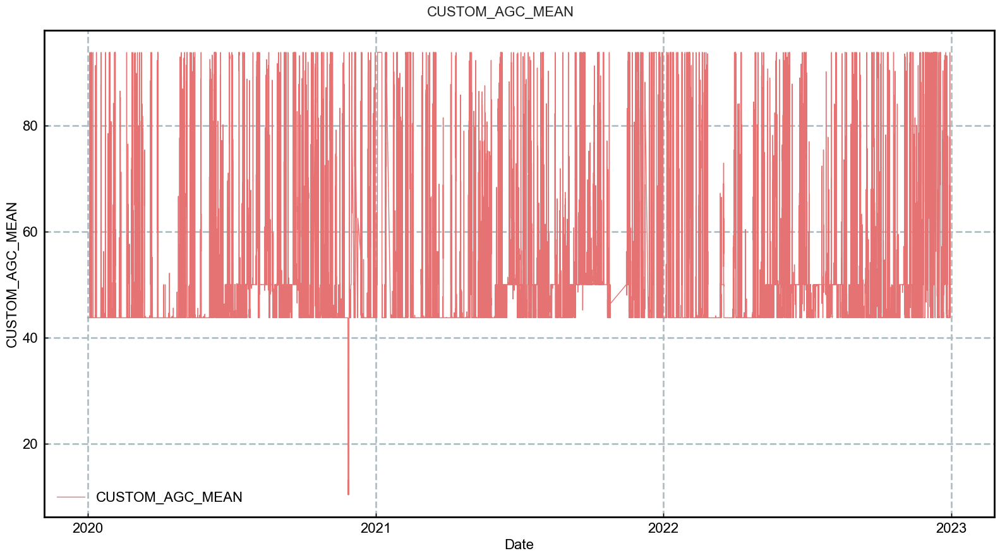

In [18]:
# TimeSeries(series=df_orig[SIGNAL_STRENGTH_COL]).plot_interactive()
TimeSeries(series=df_orig[SIGNAL_STRENGTH_COL]).plot()

In [19]:
fluxqc.signal_strength_test(signal_strength_col=SIGNAL_STRENGTH_COL,
                            method=SIGNAL_STRENGTH_METHOD, 
                            threshold=SIGNAL_STRENGTH_THRESHOLD)

Generating new flag variable FLAG_L2_FC_SIGNAL_STRENGTH_TEST, newly calculated from output variable CUSTOM_AGC_MEAN, with flag 0 (good values) where CUSTOM_AGC_MEAN <= 90, flag 2 (bad values) where CUSTOM_AGC_MEAN > 90 ...


</br>

</br>

## Flags: **Raw data screening** tests
- Flags were calculated in EddyPro

In [20]:
fluxqc.raw_data_screening_vm97_tests(spikes=True,
                                     amplitude=True,
                                     dropout=True,
                                     abslim=False,
                                     skewkurt_hf=False,
                                     skewkurt_sf=False,
                                     discont_hf=False,
                                     discont_sf=False)

Generating new flag variable FLAG_L2_FC_CO2_VM97_SPIKE_HF_TEST, values taken from output variable CO2_VM97_TEST from position 1, based on CO2, with flag 0 (good values) where test passed, flag 2 (bad values) where test failed (for hard flags) or flag 1 (ok values) where test failed (for soft flags) ...
Generating new flag variable FLAG_L2_FC_CO2_VM97_AMPLITUDE_RESOLUTION_HF_TEST, values taken from output variable CO2_VM97_TEST from position 2, based on CO2, with flag 0 (good values) where test passed, flag 2 (bad values) where test failed (for hard flags) or flag 1 (ok values) where test failed (for soft flags) ...
Generating new flag variable FLAG_L2_FC_CO2_VM97_DROPOUT_TEST, values taken from output variable CO2_VM97_TEST from position 3, based on CO2, with flag 0 (good values) where test passed, flag 2 (bad values) where test failed (for hard flags) or flag 1 (ok values) where test failed (for soft flags) ...


</br>

</br>

## Flag: **Angle-of-attack** test (optional)
- Flag was calculated in EddyPro

In [21]:
fluxqc.angle_of_attack_test()

Generating new flag variable FLAG_L2_FC_VM97_AOA_HF_TEST, values taken from output variable VM97_AOA_HF, with flag 0 (good values) where test passed, flag 2 (bad values) where test failed ...


</br>

</br>

## Add flags to dataset

In [22]:
# print(fluxqc.fluxflags)
df_level2 = fluxqc.get()

++Adding new column FLAG_L2_FC_MISSING_TEST (Level-2 quality flag) to main data ...
++Adding new column FLAG_L2_FC_SSITC_TEST (Level-2 quality flag) to main data ...
++Adding new column FLAG_L2_FC_COMPLETENESS_TEST (Level-2 quality flag) to main data ...
++Adding new column FLAG_L2_FC_SCF_TEST (Level-2 quality flag) to main data ...
++Adding new column FLAG_L2_FC_SIGNAL_STRENGTH_TEST (Level-2 quality flag) to main data ...
++Adding new column FLAG_L2_FC_CO2_VM97_SPIKE_HF_TEST (Level-2 quality flag) to main data ...
++Adding new column FLAG_L2_FC_CO2_VM97_AMPLITUDE_RESOLUTION_HF_TEST (Level-2 quality flag) to main data ...
++Adding new column FLAG_L2_FC_CO2_VM97_DROPOUT_TEST (Level-2 quality flag) to main data ...
++Adding new column FLAG_L2_FC_VM97_AOA_HF_TEST (Level-2 quality flag) to main data ...


</br>

</br>

## Available `Level-2` variables
- This shows all available Level-2 variables, also the ones created previously for other fluxes

In [23]:
[x for x in df_level2.columns if 'L2' in x]

['FLAG_L2_FC_MISSING_TEST',
 'FLAG_L2_FC_SSITC_TEST',
 'FLAG_L2_FC_COMPLETENESS_TEST',
 'FLAG_L2_FC_SCF_TEST',
 'FLAG_L2_FC_SIGNAL_STRENGTH_TEST',
 'FLAG_L2_FC_CO2_VM97_SPIKE_HF_TEST',
 'FLAG_L2_FC_CO2_VM97_AMPLITUDE_RESOLUTION_HF_TEST',
 'FLAG_L2_FC_CO2_VM97_DROPOUT_TEST',
 'FLAG_L2_FC_VM97_AOA_HF_TEST']

</br>

</br>

# **Level-3.1: Storage correction**

- Adds storage term to flux

## Inititate calculations

In [24]:
s = FluxStorageCorrectionSinglePointEddyPro(df=df_level2, fluxcol=FLUXVAR)

Detected base variable CO2 for FC.
Detected storage variable SC_SINGLE for FC.


</br>

## Calculate storage correction
- The flux storage term (single point) is added to the flux
- For some records, the storage term can be missing. In such cases, missing terms are gap-filled using random forest
- Without gap-filling the storage term, we can lose an additional e.g. 2-3% of flux data

Calculating storage-corrected flux NEE_L3.1 from flux FC and storage term SC_SINGLE ...

Adding timestamp as data columns ...
Added timestamp as columns: ['.YEAR', '.SEASON', '.MONTH', '.WEEK', '.DOY', '.HOUR', '.YEARMONTH', '.YEARDOY', '.YEARWEEK'] 

Adding continuous record number ...
Added new column .RECORDNUMBER with record numbers from 1 to 52620.

Sanitizing timestamp ...
Validating timestamp naming of timestamp column TIMESTAMP_MIDDLE ... Timestamp name OK.
Converting timestamp TIMESTAMP_MIDDLE to datetime ... OK
Sorting timestamp TIMESTAMP_MIDDLE ascending ... Removing data records with duplicate indexes ... OK (no duplicates found in timestamp index)
Creating continuous <30 * Minutes> timestamp index for timestamp TIMESTAMP_MIDDLE between 2019-12-31 19:15:00 and 2023-01-01 00:45:00 ... Building random forest model based on data between 2019-12-31 19:15:00 and 2023-01-01 00:45:00 ...


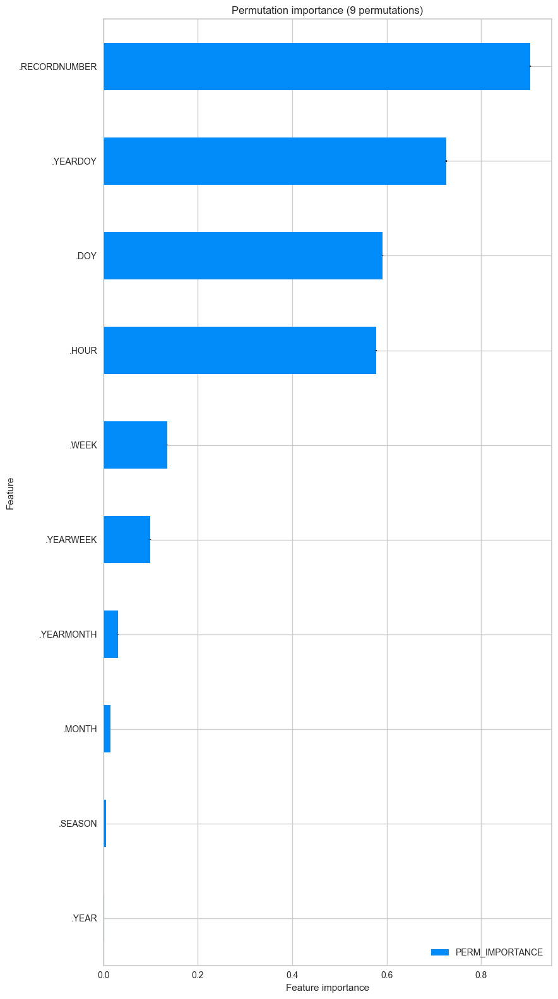

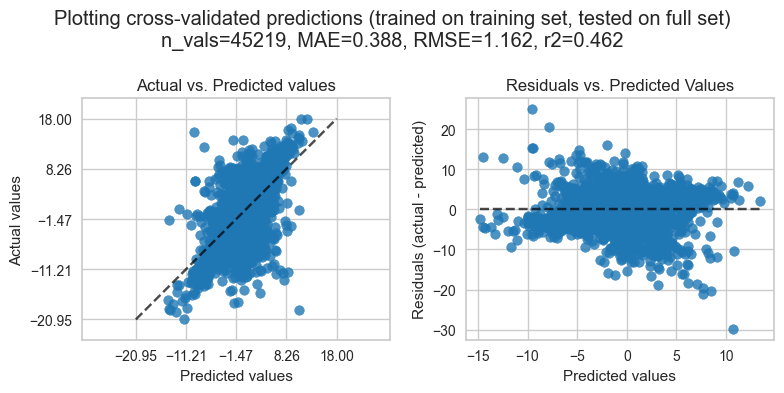


GAP-FILLING RESULTS

Model scores and feature importances were calculated from high-quality predicted targets (7401 values, SC_SINGLE_gfRF where flag=1) in comparison to observed targets (45219 values, SC_SINGLE).

## TARGET
- first timestamp:  2019-12-31 19:15:00
- last timestamp:  2023-01-01 00:45:00
- potential number of values: 52620 values)
- target column (observed):  SC_SINGLE
- missing records (observed):  7401 (cross-check from flag: 7401)
- target column (gap-filled):  SC_SINGLE_gfRF  (52620 values)
- missing records (gap-filled):  0
- gap-filling flag: FLAG_SC_SINGLE_gfRF_ISFILLED
  > flag 0 ... observed targets (45219 values)
  > flag 1 ... targets gap-filled with high-quality, all features available (7401 values)
  > flag 2 ... targets gap-filled with fallback (0 values)

## FEATURE IMPORTANCES
- names of features used in model:  ['.RECORDNUMBER', '.YEARDOY', '.DOY', '.HOUR', '.WEEK', '.YEARWEEK', '.YEARMONTH', '.MONTH', '.SEASON', '.YEAR']
- number of features used in mo

In [25]:
s.storage_correction()

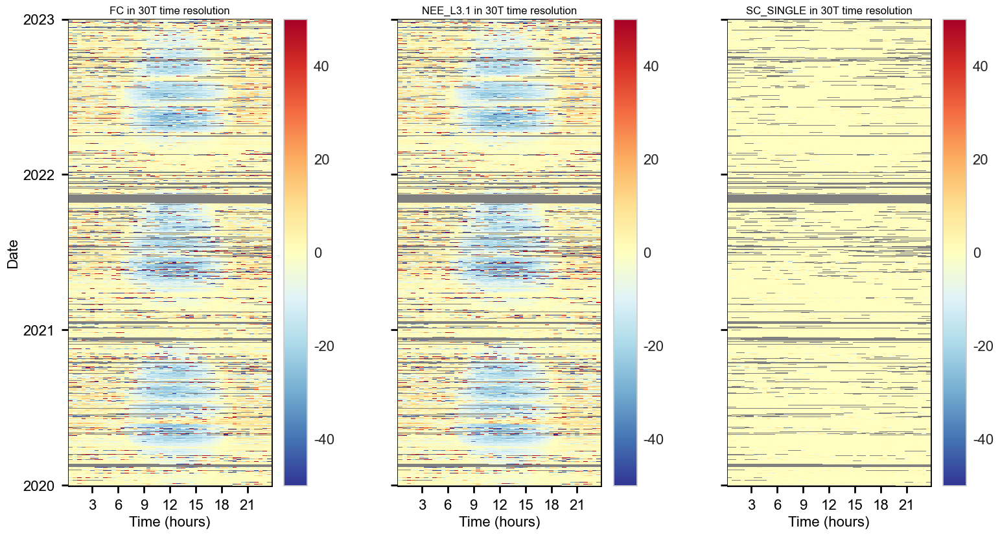

In [26]:
s.showplot(maxflux=50)

In [27]:
s.report()


REPORT: STORAGE CORRECTION FOR FC
Swiss FluxNet processing chain, L3.1: Storage Correction

The gap-filled storage term SC_SINGLE_gfRF_L3.1 was added to flux FC.
The storage-corrected flux was stored as NEE_L3.1.

The flux was available for 46335 records (FC).
Originally, the non-gapfilled storage term was available for 45219 records (SC_SINGLE).
This means that the storage term SC_SINGLE was missing for 1116 measured flux (FC) records.
After gap-filling the storage term, it was available for an additional 1116 records (SC_SINGLE_gfRF_L3.1).

In the storage-corrected flux NEE_L3.1 with 46335 records, 
  - 97.6% (45219 records) of used storage terms come from originally calculated data (SC_SINGLE)
  - 2.4% (1116 records) of used storage terms come from gap-filled data (SC_SINGLE_gfRF_L3.1)

Stats for gap-filled storage terms:
                      NOV       P01    MEDIAN       P99
SC_SINGLE_gfRF_L3.1  1116 -7.871882 -0.220917  5.435261

Stats for measured storage terms:
               

</br>

## Add results to dataset
- Adds the storage-corrected flux and the gap-filled storage term time series to the dataset

In [28]:
# print(s.storage)
df_level31 = s.get()

++Adding new column NEE_L3.1 to main data ...
++Adding new column SC_SINGLE_gfRF_L3.1 to main data ...


In [29]:
df_level31

,AIR_MV,AIR_DENSITY,AIR_RHO_CP,AIR_CP,AOA_METHOD,AXES_ROTATION_METHOD,BOWEN,BURBA_METHOD,BADM_LOCATION_LAT,BADM_LOCATION_LONG,BADM_LOCATION_ELEV,BADM_HEIGHTC,BADM_INST_SAMPLING_INT,BADM_INST_AVERAGING_INT,BADM_INST_MODEL_SA,...,WBOOST_APPLIED,WPL_APPLIED,ZL,ZL_UNCORR,FLAG_L2_FC_MISSING_TEST,FLAG_L2_FC_SSITC_TEST,FLAG_L2_FC_COMPLETENESS_TEST,FLAG_L2_FC_SCF_TEST,FLAG_L2_FC_SIGNAL_STRENGTH_TEST,FLAG_L2_FC_CO2_VM97_SPIKE_HF_TEST,FLAG_L2_FC_CO2_VM97_AMPLITUDE_RESOLUTION_HF_TEST,FLAG_L2_FC_CO2_VM97_DROPOUT_TEST,FLAG_L2_FC_VM97_AOA_HF_TEST,NEE_L3.1,SC_SINGLE_gfRF_L3.1
TIMESTAMP_MIDDLE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-12-31 19:15:00,0.024907,1.16085,1169.83,1007.74,0.0,1.0,5.765210,0.0,47.1158,8.53778,982.0,0.4,20.0,30.0,NaN,...,0.0,1.0,3.079130,3.006370,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.447004,-0.291369
2019-12-31 19:45:00,0.024865,1.16271,1171.77,1007.79,0.0,1.0,1.627180,0.0,47.1158,8.53778,982.0,0.4,20.0,30.0,NaN,...,0.0,1.0,-0.096300,-0.099549,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.091055,0.044745
2019-12-31 20:15:00,0.024910,1.16061,1169.68,1007.81,0.0,1.0,-5.226190,0.0,47.1158,8.53778,982.0,0.4,20.0,30.0,NaN,...,0.0,1.0,-0.780695,-0.771121,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.743766,-0.076706
2019-12-31 20:45:00,0.024886,1.16183,1170.78,1007.70,0.0,1.0,2.296260,0.0,47.1158,8.53778,982.0,0.4,20.0,30.0,NaN,...,0.0,1.0,0.540130,0.545173,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.105327,0.018797
2019-12-31 21:15:00,0.024874,1.16239,1171.37,1007.73,0.0,1.0,-0.195424,0.0,47.1158,8.53778,982.0,0.4,20.0,30.0,NaN,...,0.0,1.0,-0.135396,-0.095764,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.421812,-0.079972
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 22:45:00,0.025906,1.11442,1125.59,1010.02,0.0,1.0,-3.645490,0.0,47.1158,8.53778,982.0,0.4,20.0,30.0,NaN,...,0.0,1.0,0.316949,0.309181,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.279532,0.069432
2022-12-31 23:15:00,0.025770,1.12033,1131.50,1009.97,0.0,1.0,-1.667900,0.0,47.1158,8.53778,982.0,0.4,20.0,30.0,NaN,...,0.0,1.0,-0.057874,-0.056127,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.474130,0.029350
2022-12-31 23:45:00,0.025757,1.12077,1132.08,1010.09,0.0,1.0,61.622800,0.0,47.1158,8.53778,982.0,0.4,20.0,30.0,NaN,...,0.0,1.0,1.716370,1.677440,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.065241,-0.038788


</br>

## Available `Level-3.1` variables before preliminary QCF

In [30]:
_vars = [print(x) for x in df_level31.columns if 'L3.1' in x]
if FLUXVAR == 'FC':
    FLUXVAR31 = f"NEE_L3.1"
else:
    FLUXVAR31 = f"{FLUXVAR}_L3.1"  # Storage-corrected flux after Level-3.1
print(f"\nName of the storage-corrected flux variable after Level-3.1:  {FLUXVAR31}")

NEE_L3.1
SC_SINGLE_gfRF_L3.1

Name of the storage-corrected flux variable after Level-3.1:  NEE_L3.1


</br>

## Generate `QCF`, needed for Level-3.2
- `QCF` is the `quality control flag` that combines the quality tests so far into one single `QCF` flag (0-1-2)

In [31]:
qcf = FlagQCF(series=df_level31[FLUXVAR31], df=df_level31, levelid='L3.1', swinpot=df_level31['SW_IN_POT'], nighttime_threshold=50)
qcf.calculate(daytime_accept_qcf_below=2, nighttimetime_accept_qcf_below=2)
df_level31 = qcf.get()

++Adding new column SUM_L3.1_NEE_L3.1_HARDFLAGS to main data ...
++Adding new column SUM_L3.1_NEE_L3.1_SOFTFLAGS to main data ...
++Adding new column SUM_L3.1_NEE_L3.1_FLAGS to main data ...
++Adding new column FLAG_L3.1_NEE_L3.1_QCF to main data ...
++Adding new column NEE_L3.1_L3.1_QCF to main data ...


In [32]:
qcf.report_qcf_evolution()



QCF FLAG EVOLUTION
This output shows the evolution of the QCF overall quality flag
when test flags are applied sequentially to the variable NEE_L3.1.

Number of NEE_L3.1 records before QC: 46335
+++ FLAG_L2_FC_MISSING_TEST rejected 0 values (+0.00%)      TOTALS: flag 0: 46335 (100.00%) / flag 1: 0 (0.00%) / flag 2: 0 (0.00%)
+++ FLAG_L2_FC_SSITC_TEST rejected 5356 values (+11.56%)      TOTALS: flag 0: 23406 (50.51%) / flag 1: 17573 (37.93%) / flag 2: 5356 (11.56%)
+++ FLAG_L2_FC_COMPLETENESS_TEST rejected 13 values (+0.03%)      TOTALS: flag 0: 23389 (50.48%) / flag 1: 17577 (37.93%) / flag 2: 5369 (11.59%)
+++ FLAG_L2_FC_SCF_TEST rejected 0 values (+0.00%)      TOTALS: flag 0: 23383 (50.47%) / flag 1: 17583 (37.95%) / flag 2: 5369 (11.59%)
+++ FLAG_L2_FC_SIGNAL_STRENGTH_TEST rejected 1275 values (+2.75%)      TOTALS: flag 0: 23118 (49.89%) / flag 1: 16573 (35.77%) / flag 2: 6644 (14.34%)
+++ FLAG_L2_FC_CO2_VM97_SPIKE_HF_TEST rejected 494 values (+1.07%)      TOTALS: flag 0: 22905 (4

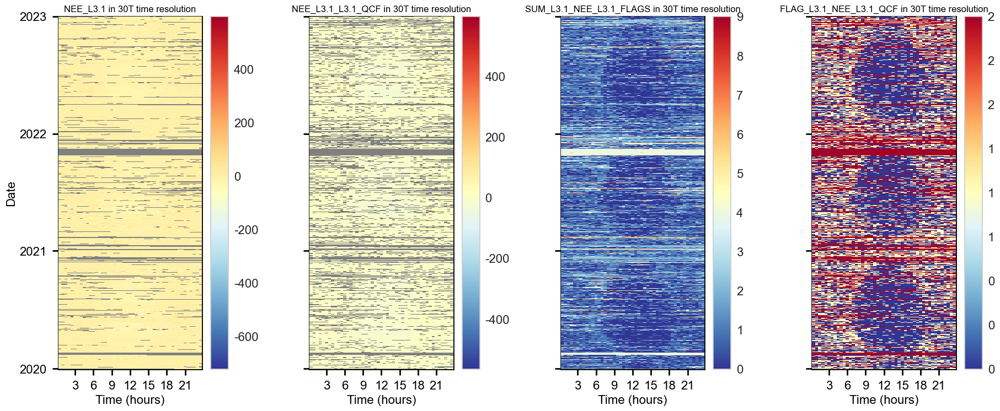

In [33]:
qcf.showplot_qcf_heatmaps()

In [34]:
qcf.report_qcf_series()



SUMMARY: FLAG_L3.1_NEE_L3.1_QCF, QCF FLAG FOR NEE_L3.1
Between 2019-12-31 19:15 and 2023-01-01 00:45 ...
    Total flux records BEFORE quality checks: 46335 (88.06% of potential)
    Available flux records AFTER quality checks: 38273 (82.60% of total)
    Rejected flux records: 8062 (17.40% of total)
    Potential flux records: 52620
    Potential flux records missed: 6285 (11.94% of potential)



In [ ]:
qcf.report_qcf_flags()

In [ ]:
qcf.showplot_qcf_timeseries()

## Available `Level-3.1` variables after preliminary QCF
- This shows all available Level-3.1 variables, also the ones created previously for other fluxes

In [35]:
_vars = [print(x) for x in df_level31.columns if 'L3.1' in x]
FLUXVAR31QCF = f"{FLUXVAR31}_L3.1_QCF"  # Quality-controlled flux after Level-3.1
print(f"\nName of the storage-corrected and quality-controlled flux variable after Level-3.1:  {FLUXVAR31QCF}  (this variable will be used in the following outlier detection)")

NEE_L3.1
SC_SINGLE_gfRF_L3.1
SUM_L3.1_NEE_L3.1_HARDFLAGS
SUM_L3.1_NEE_L3.1_SOFTFLAGS
SUM_L3.1_NEE_L3.1_FLAGS
FLAG_L3.1_NEE_L3.1_QCF
NEE_L3.1_L3.1_QCF

Name of the storage-corrected and quality-controlled flux variable after Level-3.1:  NEE_L3.1_L3.1_QCF  (this variable will be used in the following outlier detection)


</br>

</br>

# **Level-3.2: Outlier detection**
- Needs quality-controlled data (so far)

</br>

## Plot time series

In [36]:
print(f"{FLUXVAR31QCF} \n(quality-controlled Level-3.1 version of {FLUXVAR31}) \n(originally based on {FLUXVAR})")

NEE_L3.1_L3.1_QCF 
(quality-controlled Level-3.1 version of NEE_L3.1) 
(originally based on FC)


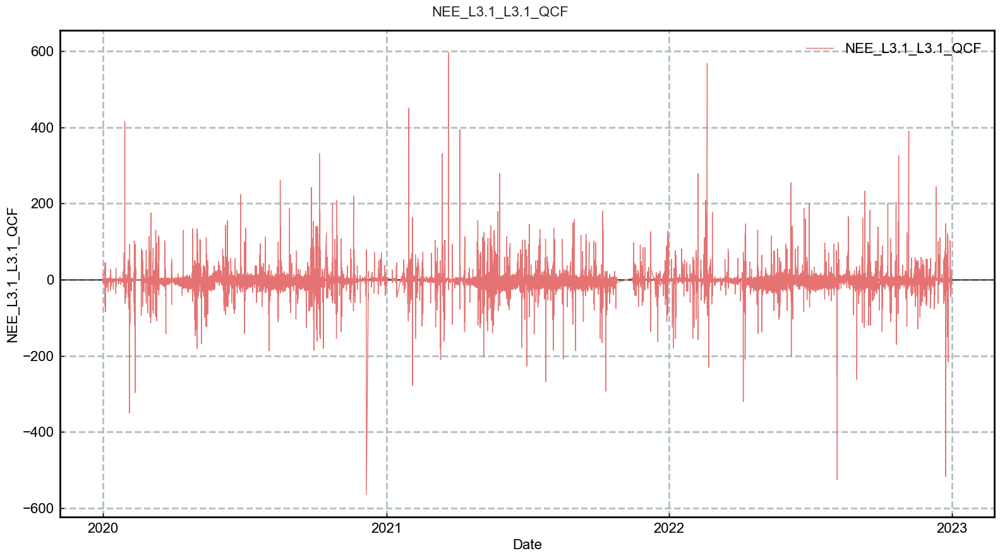

In [37]:
# TimeSeries(series=df_level31[FLUXVAR31QCF]).plot_interactive()
TimeSeries(series=df_level31[FLUXVAR31QCF]).plot()

</br>

## Initiate calculations

In [38]:
sod = StepwiseOutlierDetection(dataframe=df_level31,
                               col=FLUXVAR31QCF,
                               site_lat=SITE_LAT,
                               site_lon=SITE_LON,
                               utc_offset=1)

</br>

</br>

## Flag, outlier detection: **absolute limits, separate for daytime and nighttime data**

Identify outliers based on absolute limits separately for daytime and nighttime


[AbsoluteLimitsDaytimeNighttime]  ========================================
[AbsoluteLimitsDaytimeNighttime]  AbsoluteLimitsDaytimeNighttime
[AbsoluteLimitsDaytimeNighttime]  ========================================
Generating flag FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_ABSLIM_DTNT_TEST for variable NEE_L3.1_L3.1_QCF ...
[AbsoluteLimitsDaytimeNighttime]  Done.
[AbsoluteLimitsDaytimeNighttime]  ________________________________________


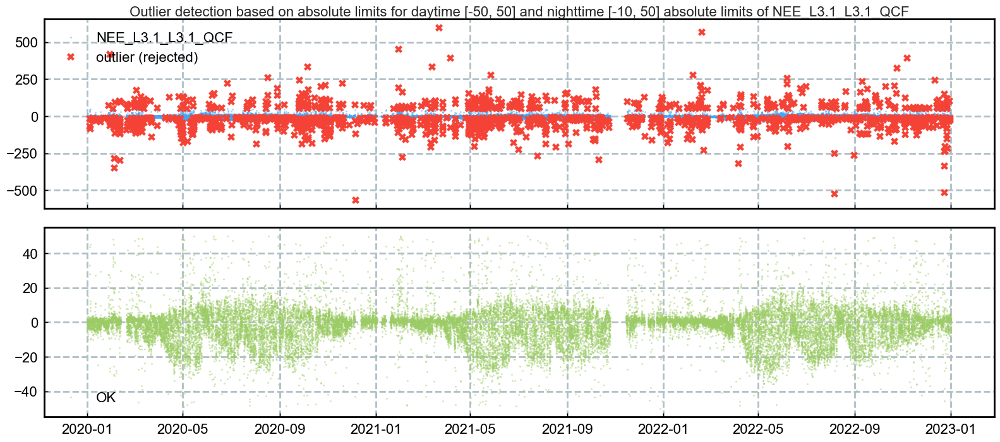

In [39]:
MIN_DT = -50
MAX_DT = 50
MIN_NT = -10
MAX_NT = 50
print(sod.flag_outliers_abslim_dtnt_test.__doc__)
sod.flag_outliers_abslim_dtnt_test(daytime_minmax=[MIN_DT, MAX_DT], nighttime_minmax=[MIN_NT, MAX_NT], showplot=True, verbose=True)

In [40]:
sod.addflag()

++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_ABSLIM_DTNT_TEST to flag data


</br>

</br>

## Flag, outlier detection: **Absolute limits**

Identify outliers based on absolute limits


[AbsoluteLimits]  ========================================
[AbsoluteLimits]  AbsoluteLimits
[AbsoluteLimits]  ========================================
Generating flag FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_ABSLIM_TEST for variable NEE_L3.1_L3.1_QCF ...
[AbsoluteLimits]  Done.
[AbsoluteLimits]  ________________________________________


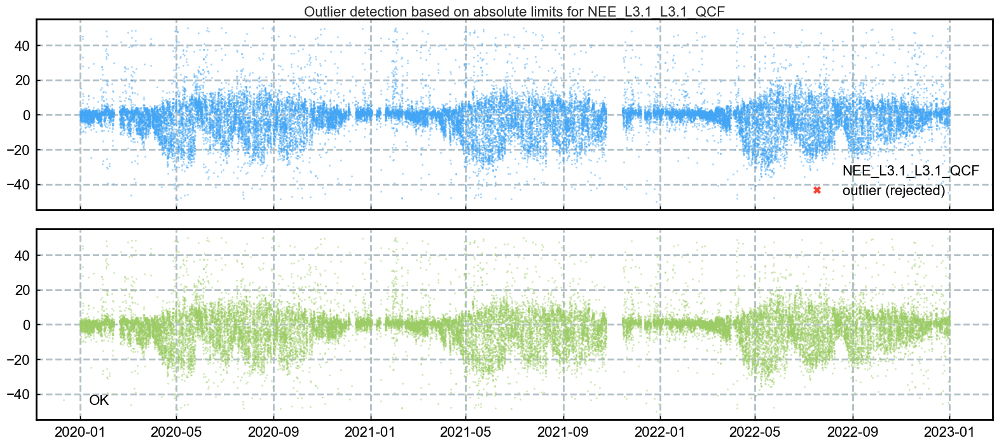

In [41]:
MIN = -50
MAX = 50
print(sod.flag_outliers_abslim_test.__doc__)
sod.flag_outliers_abslim_test(minval=MIN, maxval=MAX, showplot=True, verbose=True)

In [42]:
sod.addflag()

++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_ABSLIM_TEST to flag data


</br>

</br>

## Flag, outlier detection: **z-score over all data, separate for daytime and nighttime**

Flag outliers based on z-score, calculated separately for daytime and nighttime


[zScoreDaytimeNighttime]  ========================================
[zScoreDaytimeNighttime]  zScoreDaytimeNighttime
[zScoreDaytimeNighttime]  ========================================
Generating flag FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_ZSCOREDTNT_TEST for variable NEE_L3.1_L3.1_QCF ...
[zScoreDaytimeNighttime]  Done.
[zScoreDaytimeNighttime]  ________________________________________
Total found outliers: 111 values (daytime)
Total found outliers: 217 values (nighttime)
Total found outliers: 328 values (daytime+nighttime)


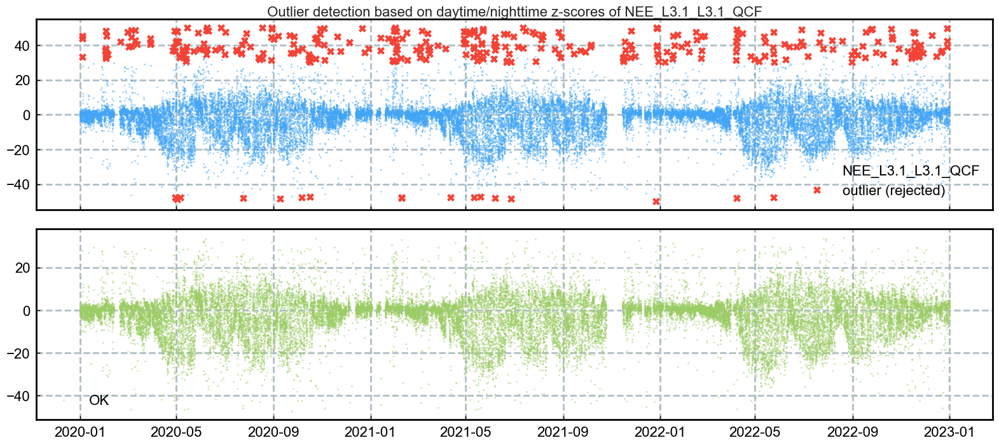

In [43]:
print(sod.flag_outliers_zscore_dtnt_test.__doc__)
sod.flag_outliers_zscore_dtnt_test(threshold=4, showplot=True, verbose=True)

In [44]:
sod.addflag()

++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_ZSCOREDTNT_TEST to flag data


</br>

</br>

## Flag, oulier detection: **Local standard deviation**

Identify outliers based on standard deviation in a rolling window


[LocalSD]  ========================================
[LocalSD]  LocalSD
[LocalSD]  ========================================
Generating flag FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_LOCALSD_TEST for variable NEE_L3.1_L3.1_QCF ...
[LocalSD]  Done.
[LocalSD]  ________________________________________


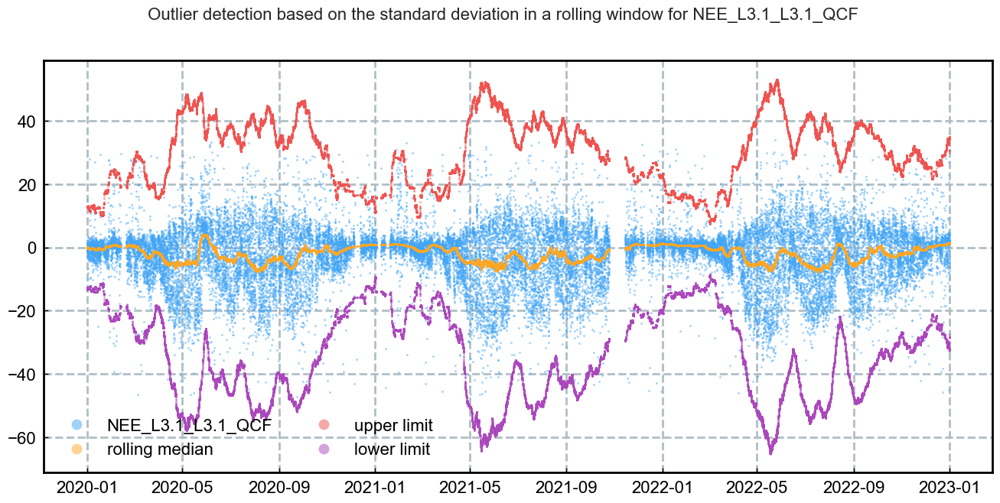

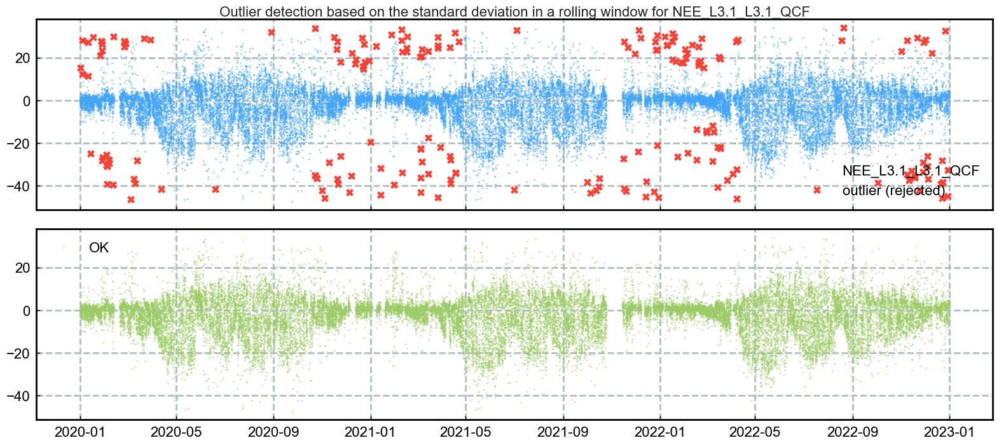

In [45]:
print(sod.flag_outliers_localsd_test.__doc__)
sod.flag_outliers_localsd_test(n_sd=4, winsize=480, showplot=True, verbose=True)

In [46]:
sod.addflag()

++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_LOCALSD_TEST to flag data


</br>

</br>

## Flag, outlier detection: **Manual flagging of datapoints**

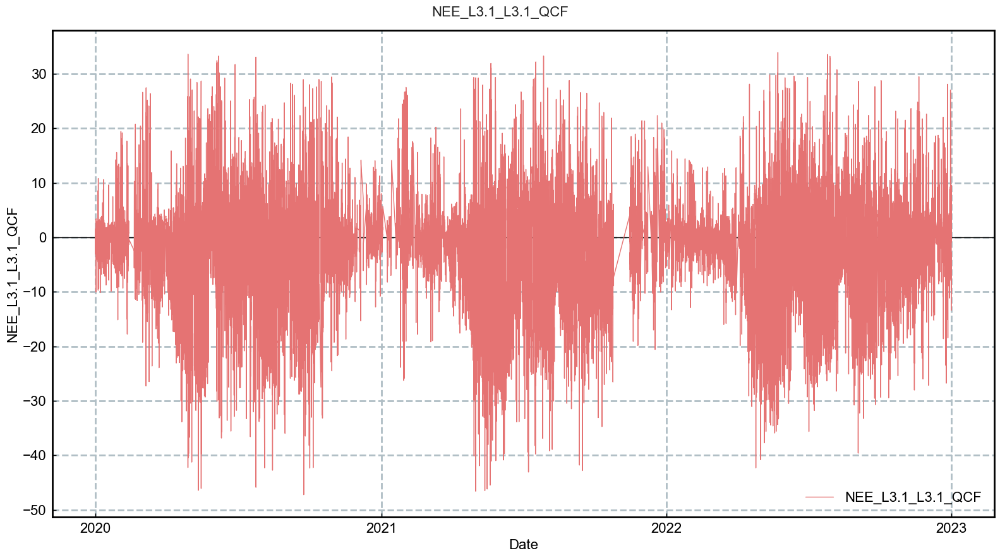

In [47]:
# sod.showplot_cleaned(interactive=True)
sod.showplot_cleaned(interactive=False)

Flag specified records for removal


[ManualRemoval]  ========================================
[ManualRemoval]  ManualRemoval
[ManualRemoval]  ========================================
Generating flag FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_MANUAL_TEST for variable NEE_L3.1_L3.1_QCF ...
[ManualRemoval]  Done.
[ManualRemoval]  ________________________________________


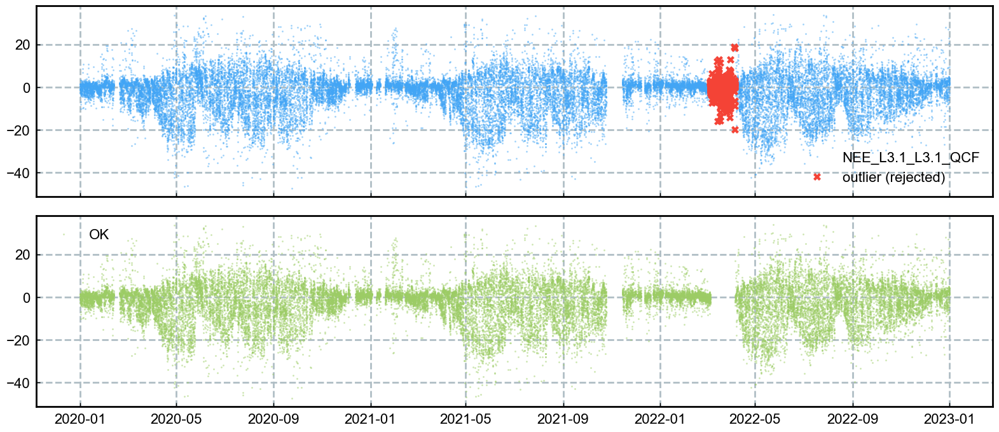

In [48]:
print(sod.flag_manualremoval_test.__doc__)
sod.flag_manualremoval_test(remove_dates=[['2022-03-05 19:45:00', '2022-04-05 19:45:00']],
                            showplot=True, verbose=True)

In [49]:
sod.addflag()

++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_MANUAL_TEST to flag data


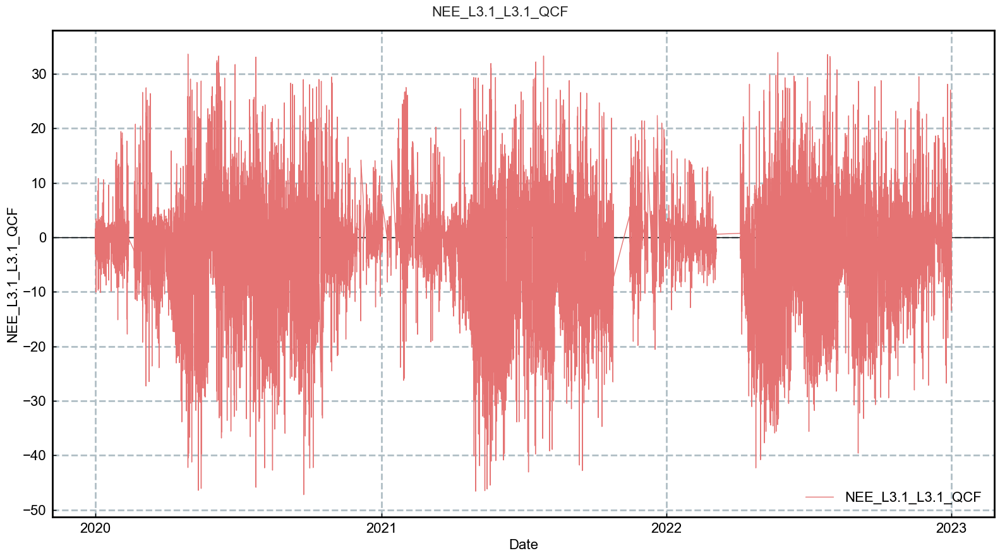

In [50]:
# sod.showplot_cleaned(interactive=True)
sod.showplot_cleaned(interactive=False)

</br>

</br>

## Flag, outlier detection: **Increments z-score**

Identify outliers based on the z-score of record increments


[zScoreIncrements]  ========================================
[zScoreIncrements]  zScoreIncrements
[zScoreIncrements]  ========================================
Generating flag FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_INCRZ_TEST for variable NEE_L3.1_L3.1_QCF ...
[zScoreIncrements]  Done.
[zScoreIncrements]  ________________________________________


[zScore]  ========================================
[zScore]  zScore
[zScore]  ========================================
Generating flag FLAG_INCREMENT_OUTLIER_ZSCORE_TEST for variable INCREMENT ...
[zScore]  Done.
[zScore]  ________________________________________
Total found outliers: 23 values
Total found outliers: 23 values (daytime+nighttime)


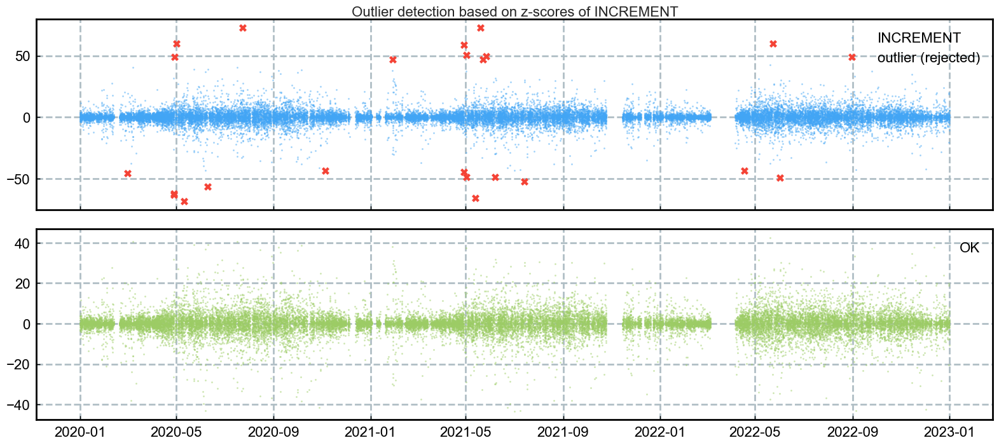

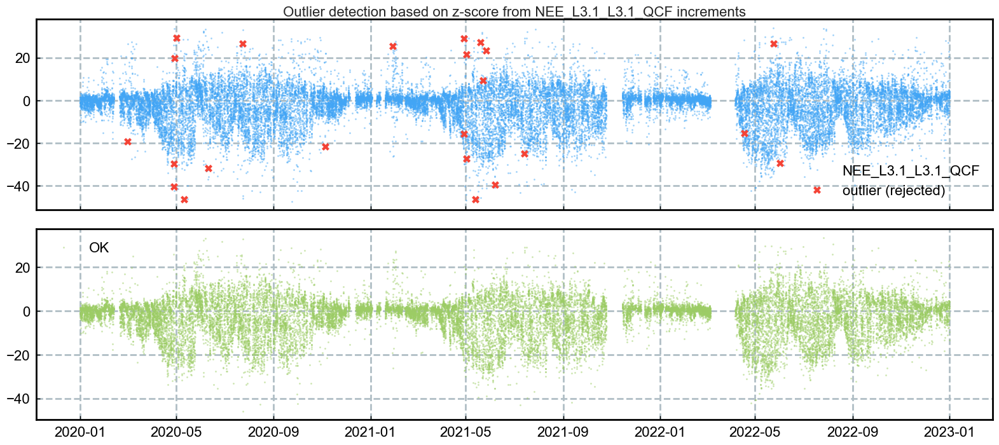

In [51]:
print(sod.flag_outliers_increments_zcore_test.__doc__)
sod.flag_outliers_increments_zcore_test(threshold=8, showplot=True, verbose=True)

In [52]:
sod.addflag()

++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_INCRZ_TEST to flag data


</br>

</br>

## Flag, outlier detection: **z-score over all data**

Identify outliers based on the z-score of records


[zScore]  ========================================
[zScore]  zScore
[zScore]  ========================================
Generating flag FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_ZSCORE_TEST for variable NEE_L3.1_L3.1_QCF ...
[zScore]  Done.
[zScore]  ________________________________________
Total found outliers: 1 values


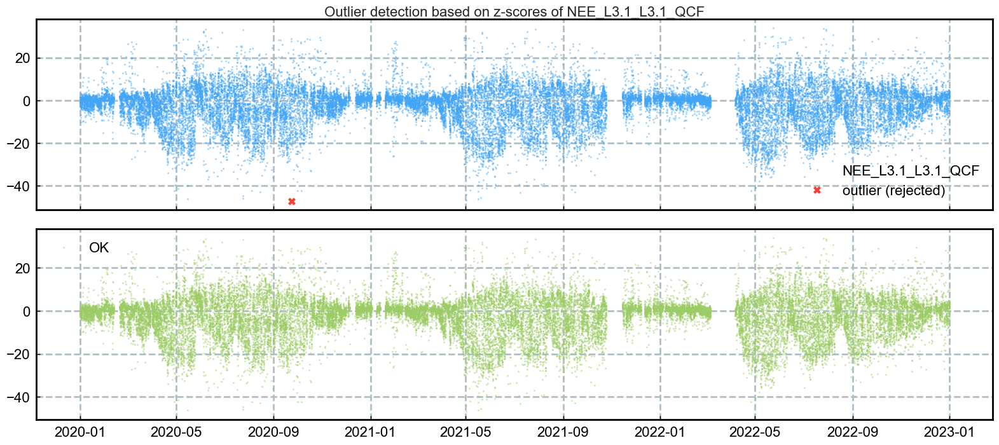

In [53]:
print(sod.flag_outliers_zscore_test.__doc__)
sod.flag_outliers_zscore_test(threshold=5, showplot=True, verbose=True)

In [54]:
sod.addflag()

++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_ZSCORE_TEST to flag data


</br>

</br>

## Flag, outlier detection: **Seasonal trend decomposition with z-score on residuals**

Identify outliers based on seasonal-trend decomposition and z-score calculations


[OutlierSTLRZ]  ========================================
[OutlierSTLRZ]  OutlierSTLRZ
[OutlierSTLRZ]  ========================================
Generating flag FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_STLRZ_TEST for variable NEE_L3.1_L3.1_QCF ...
[OutlierSTLRZ]  Done.
[OutlierSTLRZ]  ________________________________________

Adding timestamp as data columns ...
Added timestamp as columns: ['.YEAR', '.SEASON', '.MONTH', '.WEEK', '.DOY', '.HOUR', '.YEARMONTH', '.YEARDOY', '.YEARWEEK'] 

Adding continuous record number ...
Added new column .RECORDNUMBER with record numbers from 1 to 52620.

Sanitizing timestamp ...
Validating timestamp naming of timestamp column TIMESTAMP_MIDDLE ... Timestamp name OK.
Converting timestamp TIMESTAMP_MIDDLE to datetime ... OK
Sorting timestamp TIMESTAMP_MIDDLE ascending ... Removing data records with duplicate indexes ... OK (no duplicates found in timestamp index)
Creating continuous <

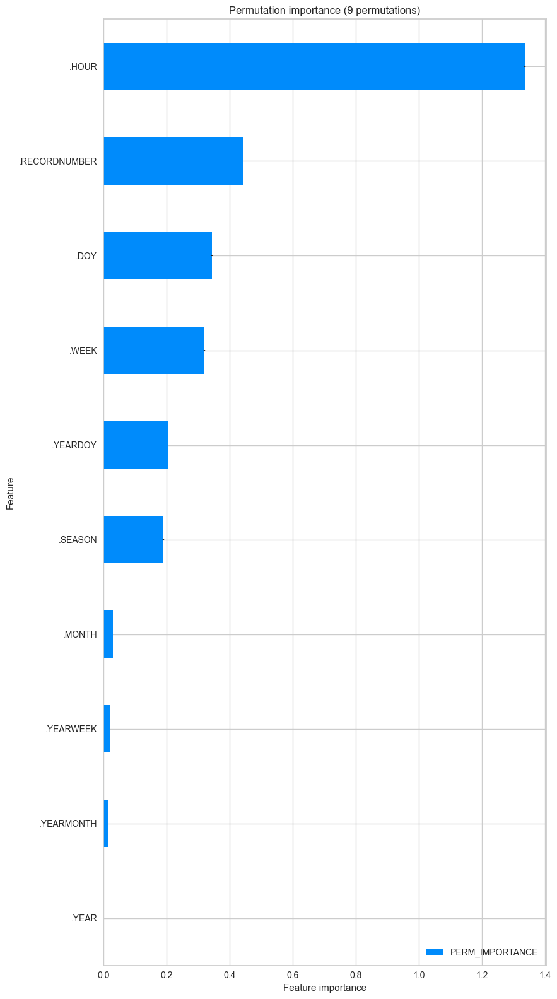

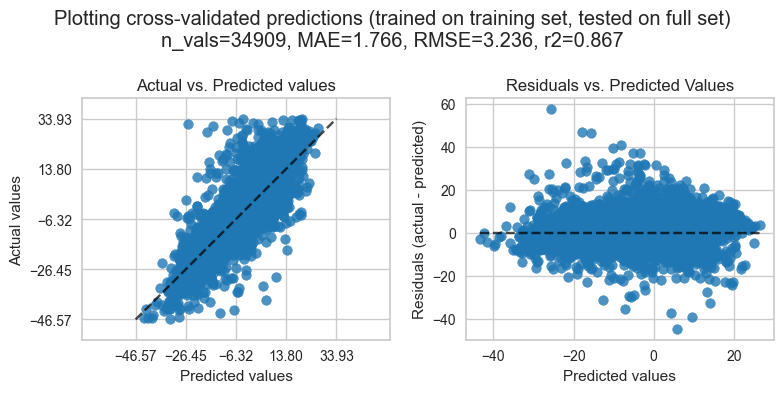

Decomposing timeseries ...


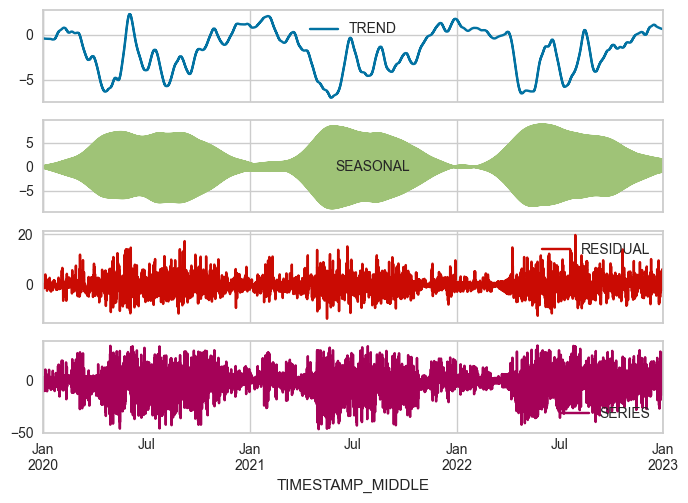

Detecting residual outliers ...


[zScoreDaytimeNighttime]  ========================================
[zScoreDaytimeNighttime]  zScoreDaytimeNighttime
[zScoreDaytimeNighttime]  ========================================
Generating flag FLAG_RESIDUAL_OUTLIER_ZSCOREDTNT_TEST for variable RESIDUAL ...
[zScoreDaytimeNighttime]  Done.
[zScoreDaytimeNighttime]  ________________________________________
Total found outliers: 289 values (daytime)
Total found outliers: 308 values (nighttime)
Total found outliers: 597 values (daytime+nighttime)
New outliers: 382


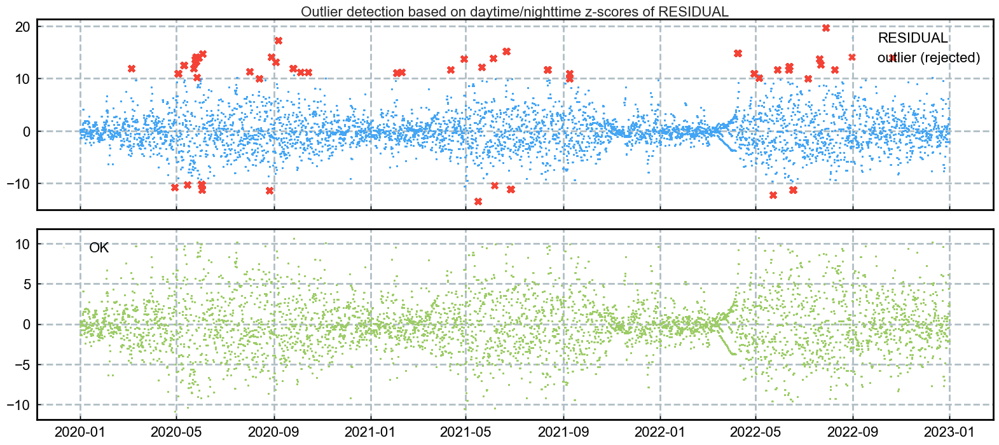

In [55]:
print(sod.flag_outliers_stl_rz_test.__doc__)
sod.flag_outliers_stl_rz_test(zfactor=3, decompose_downsampling_freq='6H', repeat=False, showplot=True)

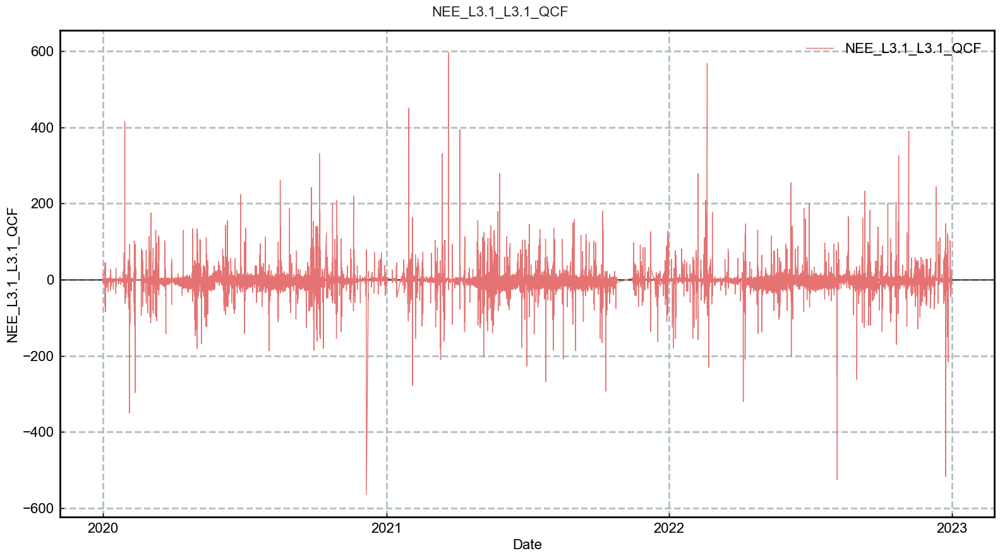

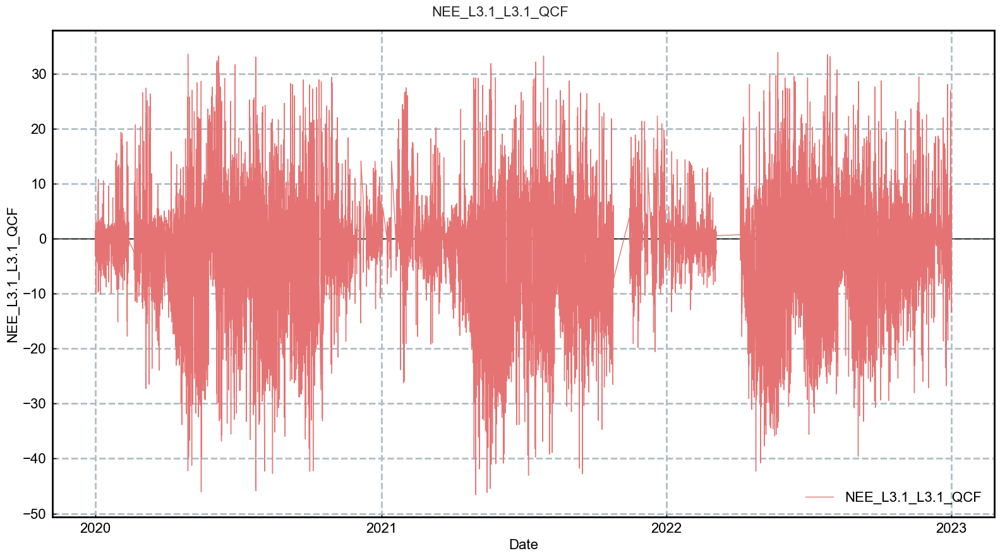

In [56]:
sod.showplot_orig()
sod.showplot_cleaned()

In [57]:
sod.addflag()

++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_STLRZ_TEST to flag data


</br>

</br>

## Flag, outlier detection: **Thymeboost**
- More info about [thymeboost](https://github.com/tblume1992/ThymeBoost)

Identify outliers based on thymeboost


[ThymeBoostOutlier]  ========================================
[ThymeBoostOutlier]  ThymeBoostOutlier
[ThymeBoostOutlier]  ========================================
Generating flag FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_THYME_TEST for variable NEE_L3.1_L3.1_QCF ...
[ThymeBoostOutlier]  Done.
[ThymeBoostOutlier]  ________________________________________

Adding timestamp as data columns ...
Added timestamp as columns: ['.YEAR', '.SEASON', '.MONTH', '.WEEK', '.DOY', '.HOUR', '.YEARMONTH', '.YEARDOY', '.YEARWEEK'] 

Adding continuous record number ...
Added new column .RECORDNUMBER with record numbers from 1 to 52620.

Sanitizing timestamp ...
Validating timestamp naming of timestamp column TIMESTAMP_MIDDLE ... Timestamp name OK.
Converting timestamp TIMESTAMP_MIDDLE to datetime ... OK
Sorting timestamp TIMESTAMP_MIDDLE ascending ... Removing data records with duplicate indexes ... OK (no duplicates found in timestamp index)
Creating continuous <30 * Minutes>

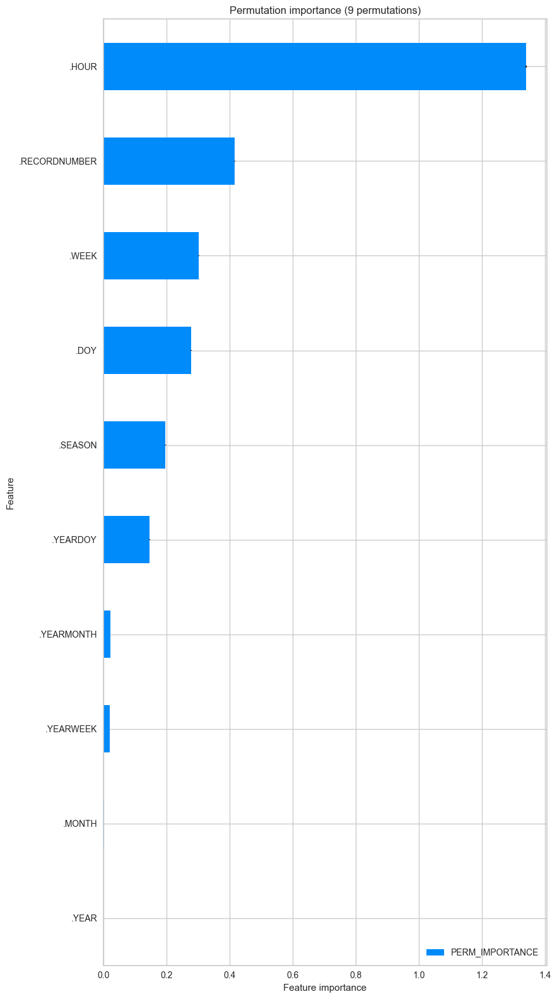

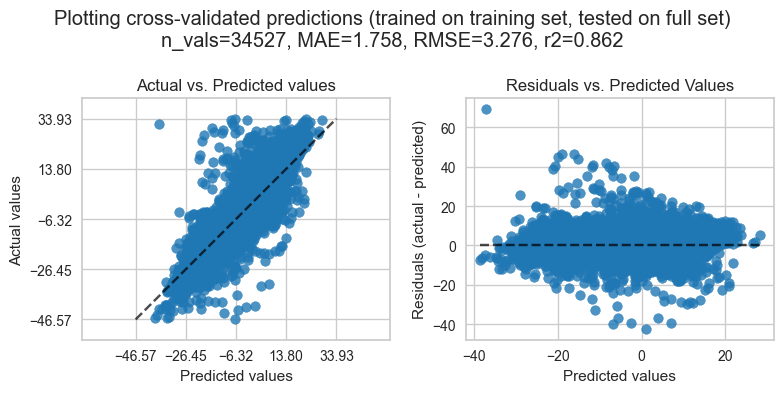

========================Repetition #1========================
********** Round 1 **********
Using Split: None
Fitting initial trend globally with trend model:
median()
seasonal model:
fourier(10, False)
cost: 202953.94200497345
********** Round 2 **********
Using Split: 2020-07-17 06:45:00
Fitting local with trend model:
ses()
seasonal model:
fourier(10, False)
cost: 130694.63046318114
Boosting Terminated 
Using round 2


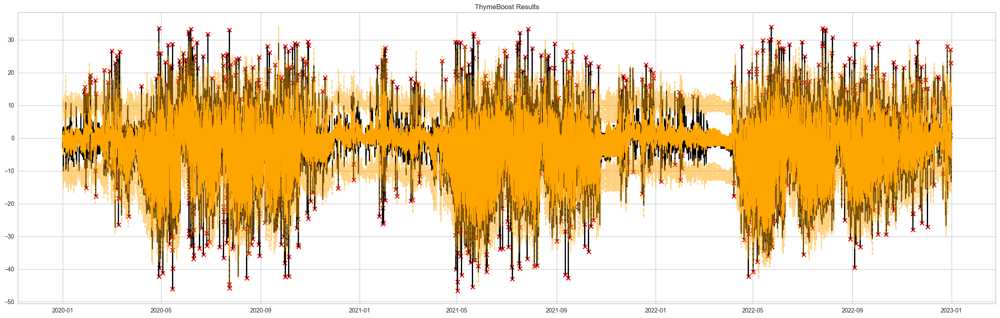

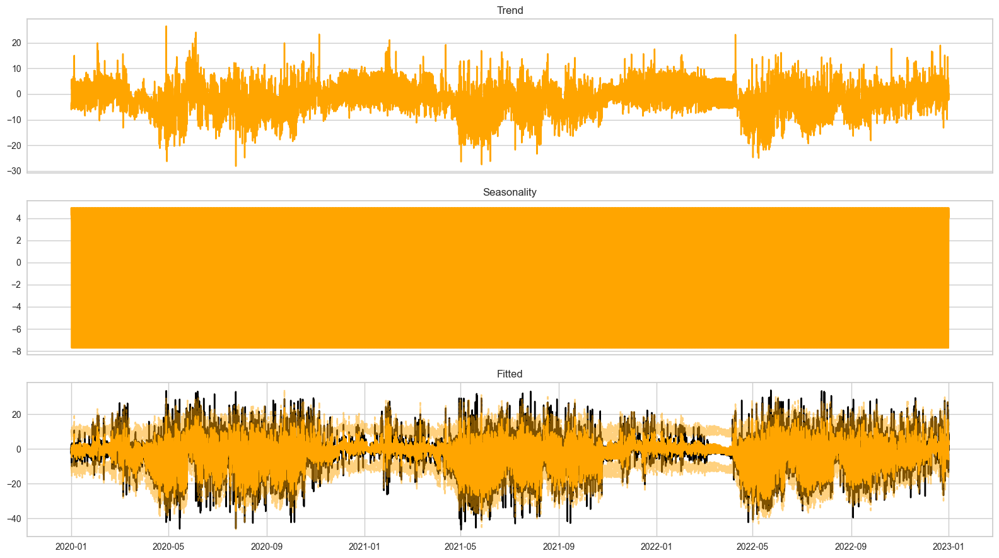

========================Repetition #2========================
********** Round 1 **********
Using Split: None
Fitting initial trend globally with trend model:
median()
seasonal model:
fourier(10, False)
cost: 196294.3464438781
********** Round 2 **********
Using Split: 2021-07-08 09:15:00
Fitting local with trend model:
ses()
seasonal model:
fourier(10, False)
cost: 97885.12779178294
********** Round 3 **********
Using Split: 2020-10-17 16:15:00
Fitting local with trend model:
ses()
seasonal model:
fourier(10, False)
cost: 97538.72424382239
Boosting Terminated 
Using round 3


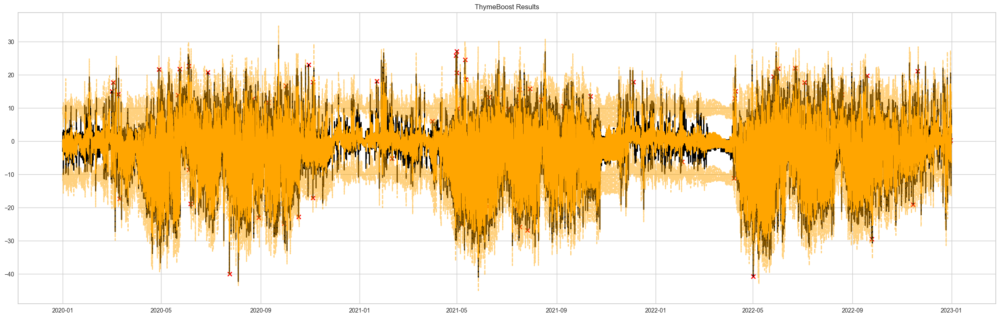

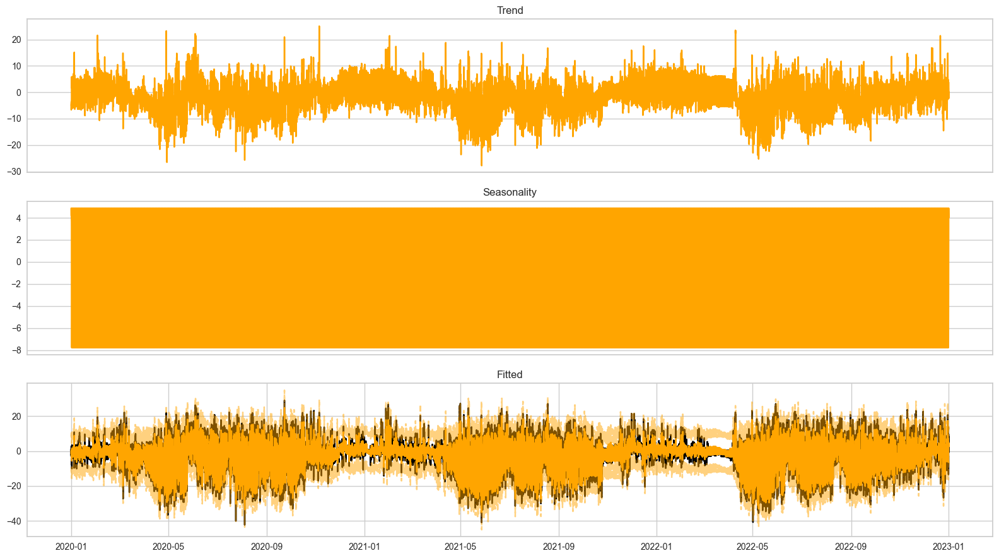

Total found outliers: 1088 values


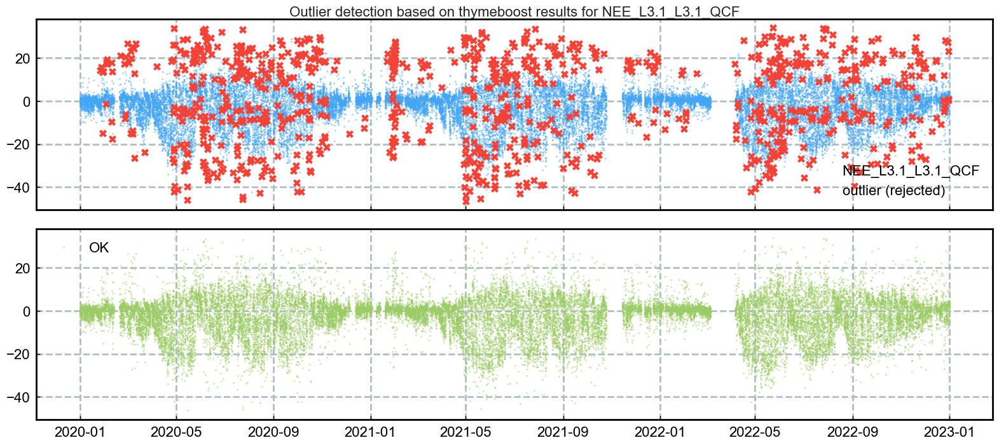

In [58]:
print(sod.flag_outliers_thymeboost_test.__doc__)
sod.flag_outliers_thymeboost_test(showplot=True, verbose=True)

In [59]:
sod.addflag()

++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_THYME_TEST to flag data


</br>

</br>

## Flag, outlier detection: **Local outlier factor**

Local outlier factor, across all data


[LocalOutlierFactorAllData]  ========================================
[LocalOutlierFactorAllData]  LocalOutlierFactorAllData
[LocalOutlierFactorAllData]  ========================================
Generating flag FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_LOF_TEST for variable NEE_L3.1_L3.1_QCF ...
[LocalOutlierFactorAllData]  Done.
[LocalOutlierFactorAllData]  ________________________________________
Total found outliers: 169 values (daytime)
Total found outliers: 169 values (daytime+nighttime)


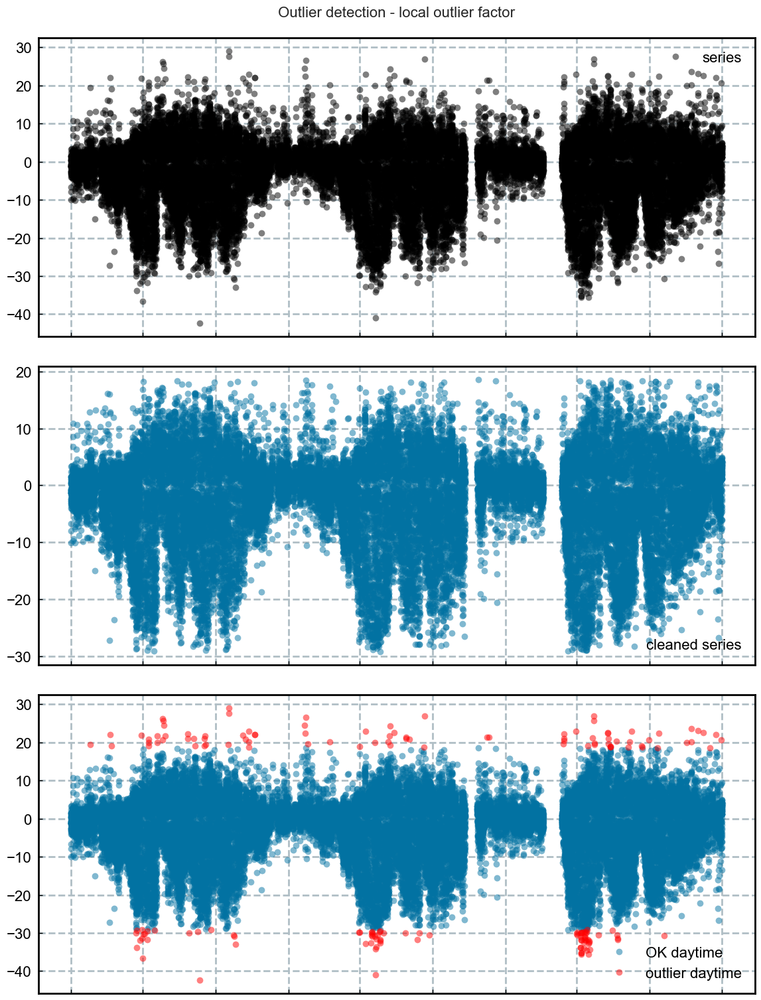

In [60]:
print(sod.flag_outliers_lof_test.__doc__)
sod.flag_outliers_lof_test(n_neighbors=None, contamination=0.005, showplot=True, verbose=True)

In [61]:
sod.addflag()

++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_LOF_TEST to flag data


</br>

</br>

## Flag, outlier detection: **Local outlier factor, daytime/nighttime**

Local outlier factor, separately for daytime and nighttime data


[LocalOutlierFactorDaytimeNighttime]  ========================================
[LocalOutlierFactorDaytimeNighttime]  LocalOutlierFactorDaytimeNighttime
[LocalOutlierFactorDaytimeNighttime]  ========================================
Generating flag FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_LOFDTNT_TEST for variable NEE_L3.1_L3.1_QCF ...
[LocalOutlierFactorDaytimeNighttime]  Done.
[LocalOutlierFactorDaytimeNighttime]  ________________________________________
Total found outliers: 9 values (daytime)
Total found outliers: 9 values (nighttime)
Total found outliers: 18 values (daytime+nighttime)


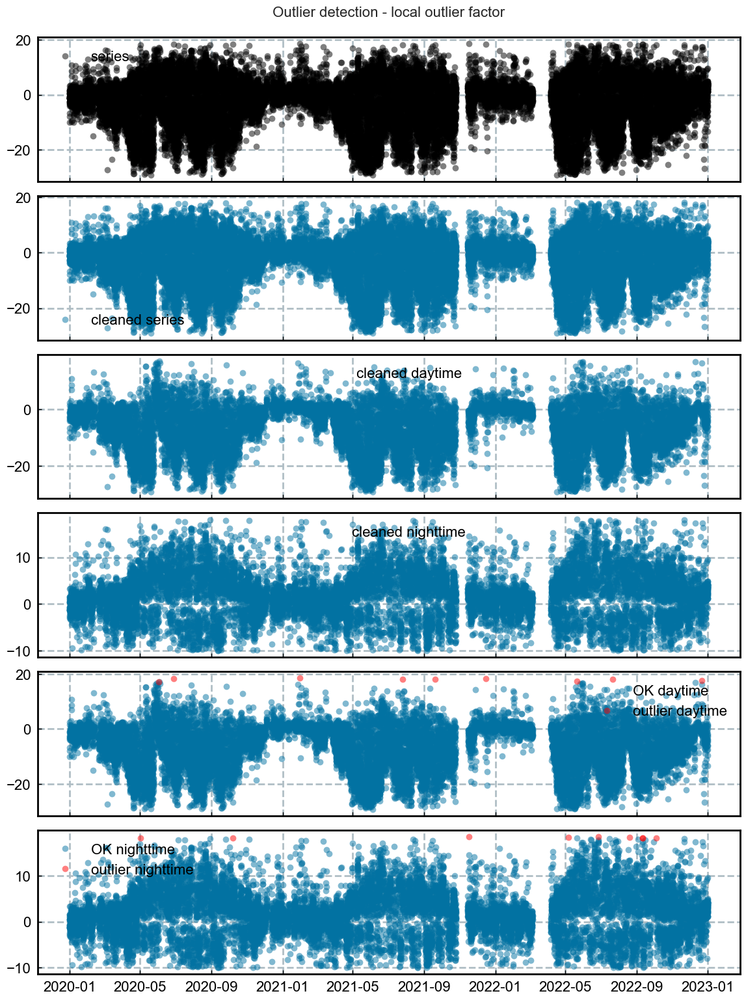

In [62]:
print(sod.flag_outliers_lof_dtnt_test.__doc__)
sod.flag_outliers_lof_dtnt_test(n_neighbors=None, contamination=0.0005, showplot=True, verbose=True)

In [63]:
sod.addflag()

++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_LOFDTNT_TEST to flag data


</br>

</br>

## Show outlier-cleaned flux

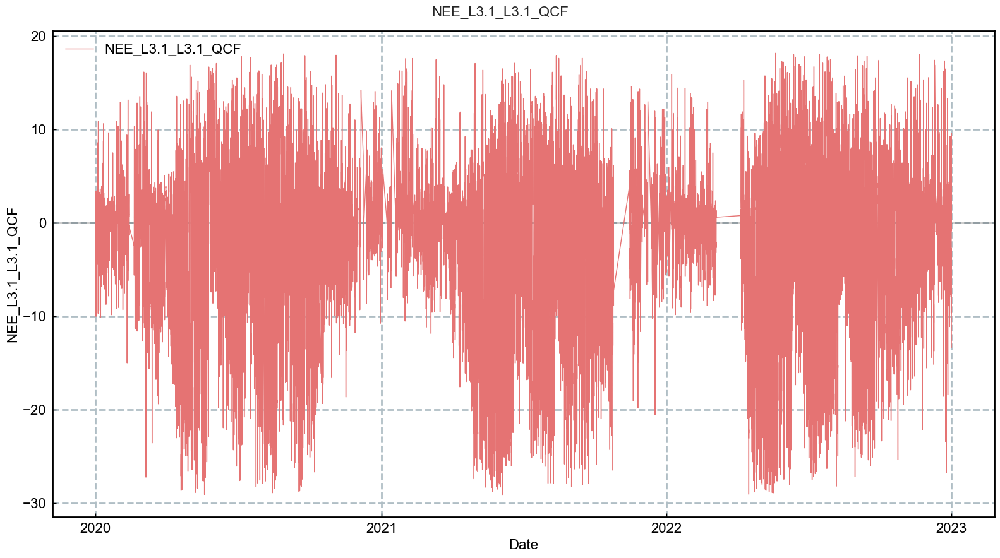

In [64]:
# sod.showplot_cleaned(interactive=True)
sod.showplot_cleaned(interactive=False)

</br>

</br>

## Finalize outlier detection: **Collect all flags**

In [65]:
df_level32 = sod.get()


Merging flags with full dataframe:
++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_ABSLIM_DTNT_TEST as new column to full dataframe
++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_ABSLIM_TEST as new column to full dataframe
++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_ZSCOREDTNT_TEST as new column to full dataframe
++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_LOCALSD_TEST as new column to full dataframe
++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_MANUAL_TEST as new column to full dataframe
++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_INCRZ_TEST as new column to full dataframe
++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_ZSCORE_TEST as new column to full dataframe
++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_STLRZ_TEST as new column to full dataframe
++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_THYME_TEST as new column to full dataframe
++Added flag column FLAG_NEE_L3.1_L3.1_QCF_OUTLIER_LOF_TEST as new column to full dataframe
++Added fl

</br>

## Generate `QCF`, needed for Level-3.3

In [66]:
qcf = FlagQCF(series=df_level32[FLUXVAR31], df=df_level32, levelid='L3.2', swinpot=df_level32['SW_IN_POT'], nighttime_threshold=50)
qcf.calculate(daytime_accept_qcf_below=2, nighttimetime_accept_qcf_below=2)
df_level32_qcf = qcf.get()

++Adding new column SUM_L3.2_NEE_L3.1_HARDFLAGS to main data ...
++Adding new column SUM_L3.2_NEE_L3.1_SOFTFLAGS to main data ...
++Adding new column SUM_L3.2_NEE_L3.1_FLAGS to main data ...
++Adding new column FLAG_L3.2_NEE_L3.1_QCF to main data ...
++Adding new column NEE_L3.1_L3.2_QCF to main data ...


In [67]:
qcf.report_qcf_evolution()



QCF FLAG EVOLUTION
This output shows the evolution of the QCF overall quality flag
when test flags are applied sequentially to the variable NEE_L3.1.

Number of NEE_L3.1 records before QC: 46335
+++ FLAG_L2_FC_MISSING_TEST rejected 0 values (+0.00%)      TOTALS: flag 0: 46335 (100.00%) / flag 1: 0 (0.00%) / flag 2: 0 (0.00%)
+++ FLAG_L2_FC_SSITC_TEST rejected 5356 values (+11.56%)      TOTALS: flag 0: 23406 (50.51%) / flag 1: 17573 (37.93%) / flag 2: 5356 (11.56%)
+++ FLAG_L2_FC_COMPLETENESS_TEST rejected 13 values (+0.03%)      TOTALS: flag 0: 23389 (50.48%) / flag 1: 17577 (37.93%) / flag 2: 5369 (11.59%)
+++ FLAG_L2_FC_SCF_TEST rejected 0 values (+0.00%)      TOTALS: flag 0: 23383 (50.47%) / flag 1: 17583 (37.95%) / flag 2: 5369 (11.59%)
+++ FLAG_L2_FC_SIGNAL_STRENGTH_TEST rejected 1275 values (+2.75%)      TOTALS: flag 0: 23118 (49.89%) / flag 1: 16573 (35.77%) / flag 2: 6644 (14.34%)
+++ FLAG_L2_FC_CO2_VM97_SPIKE_HF_TEST rejected 494 values (+1.07%)      TOTALS: flag 0: 22905 (4

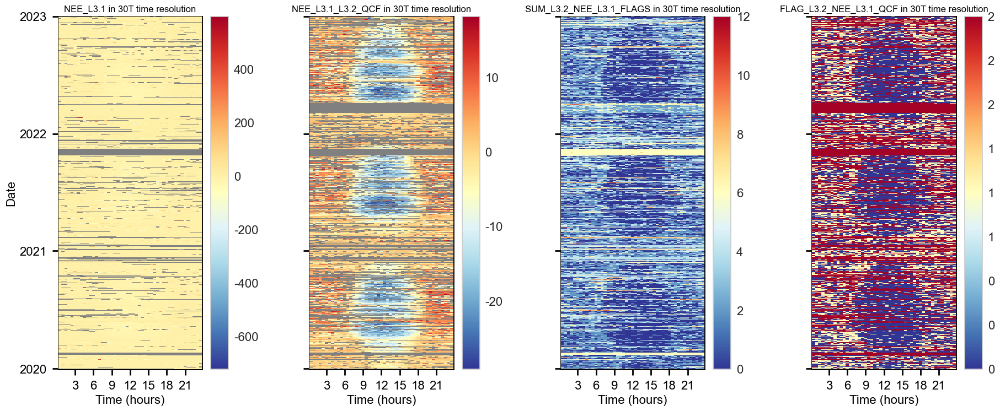

In [68]:
qcf.showplot_qcf_heatmaps()

In [69]:
qcf.report_qcf_series()



SUMMARY: FLAG_L3.2_NEE_L3.1_QCF, QCF FLAG FOR NEE_L3.1
Between 2019-12-31 19:15 and 2023-01-01 00:45 ...
    Total flux records BEFORE quality checks: 46335 (88.06% of potential)
    Available flux records AFTER quality checks: 33431 (72.15% of total)
    Rejected flux records: 12904 (27.85% of total)
    Potential flux records: 52620
    Potential flux records missed: 6285 (11.94% of potential)



In [ ]:
qcf.report_qcf_flags()

In [ ]:
qcf.showplot_qcf_timeseries()

</br>

## Available `Level-3.2` variables after preliminary QCF
- This shows all available Level-3.2 variables, also the ones created previously for other fluxes

In [70]:
_vars = [print(x) for x in df_level32_qcf.columns if 'L3.2' in x]
FLUXVAR32QCF = f"{FLUXVAR31}_L3.2_QCF"  # Quality-controlled flux after Level-3.2
print(f"\nName of the storage-corrected and quality-controlled flux variable after Level-3.2:  {FLUXVAR32QCF}")

SUM_L3.2_NEE_L3.1_HARDFLAGS
SUM_L3.2_NEE_L3.1_SOFTFLAGS
SUM_L3.2_NEE_L3.1_FLAGS
FLAG_L3.2_NEE_L3.1_QCF
NEE_L3.1_L3.2_QCF

Name of the storage-corrected and quality-controlled flux variable after Level-3.2:  NEE_L3.1_L3.2_QCF


</br>

## Plot quality-controlled flux after `Level-3.2`
- Plot flux after storage-correction, flux quality control and outlier removal

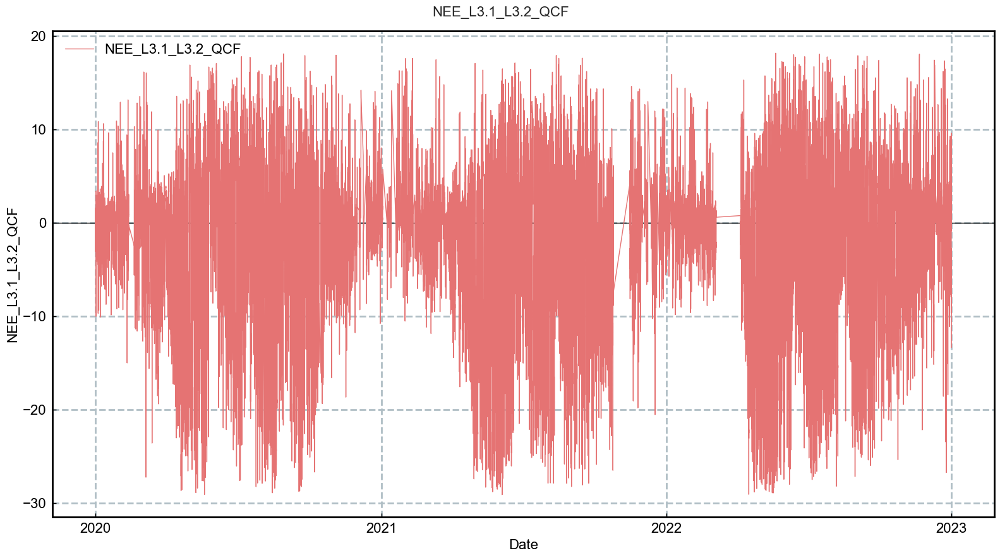

In [71]:
# TimeSeries(series=df_level32_qcf[FLUXVAR32QCF]).plot_interactive()
TimeSeries(series=df_level32_qcf[FLUXVAR32QCF]).plot()

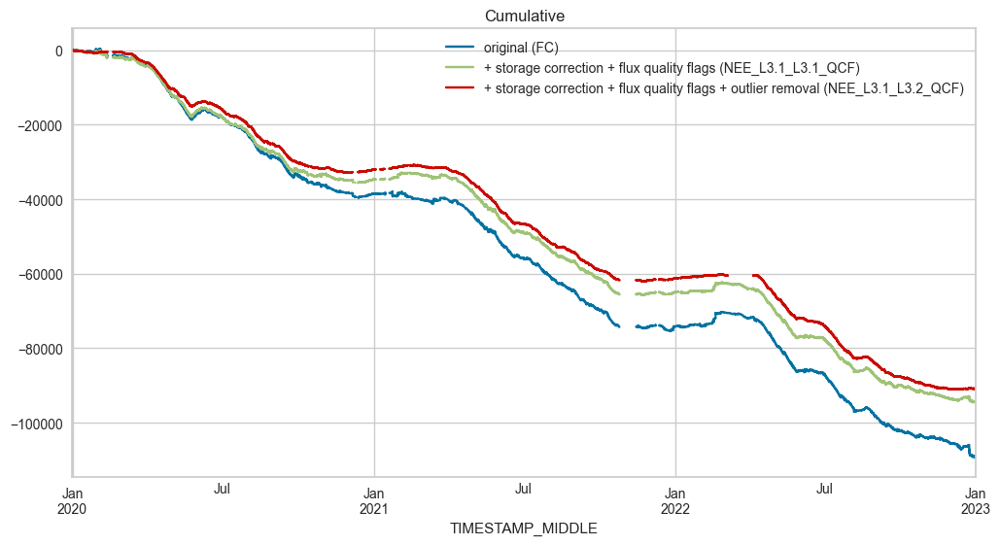

In [72]:
# Creating a dictionary by passing Series objects as values
frame = {
    f'original ({FLUXVAR})': df_level32_qcf[FLUXVAR],
    f'+ storage correction + flux quality flags ({FLUXVAR31QCF})': df_level32_qcf[FLUXVAR31QCF],    
    f'+ storage correction + flux quality flags + outlier removal ({FLUXVAR32QCF})': df_level32_qcf[FLUXVAR32QCF]
}

overview = pd.DataFrame(frame)
overview.cumsum().plot(title=f"Cumulative", figsize=(12, 6));

</br>

# **Overview after `Level-3.2`**

## Available `Level-3.2` fluxes

In [73]:
_fluxcols = [x for x in df_level32_qcf.columns if 'L3.1' and 'L3.2' in x and str(x).endswith('_QCF') and not str(x).startswith('FLAG_') ]
_fluxcols

['NEE_L3.1_L3.2_QCF']

In [74]:
_subset = df_level32_qcf[_fluxcols]
_subset

,NEE_L3.1_L3.2_QCF
TIMESTAMP_MIDDLE,
2019-12-31 19:15:00,0.447004
2019-12-31 19:45:00,-3.091055
2019-12-31 20:15:00,-2.743766
2019-12-31 20:45:00,1.105327
2019-12-31 21:15:00,-2.421812
...,...
2022-12-31 22:45:00,1.279532
2022-12-31 23:15:00,NaN
2022-12-31 23:45:00,4.065241


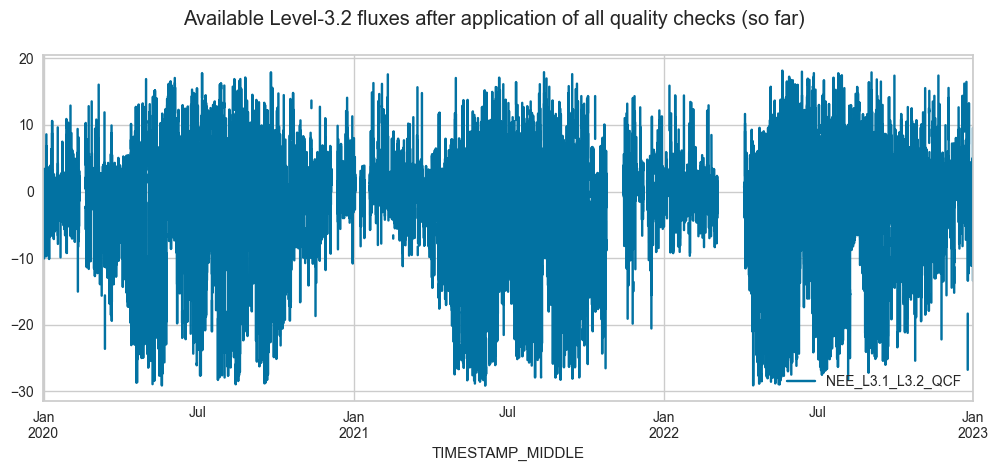

In [75]:
_subset.plot(subplots=True, title="Available Level-3.2 fluxes after application of all quality checks (so far)", figsize=(12, 4.5));

In [86]:
boxplots_df = df_level32_qcf[[FLUXVAR32QCF, "NIGHT"]].copy()
boxplots_df["MONTH"] = boxplots_df.index.month
boxplots_df

,NEE_L3.1_L3.2_QCF,NIGHT,MONTH
TIMESTAMP_MIDDLE,,,
2019-12-31 19:15:00,0.447004,1.0,12
2019-12-31 19:45:00,-3.091055,1.0,12
2019-12-31 20:15:00,-2.743766,1.0,12
2019-12-31 20:45:00,1.105327,1.0,12
2019-12-31 21:15:00,-2.421812,1.0,12
...,...,...,...
2022-12-31 22:45:00,1.279532,1.0,12
2022-12-31 23:15:00,NaN,1.0,12
2022-12-31 23:45:00,4.065241,1.0,12


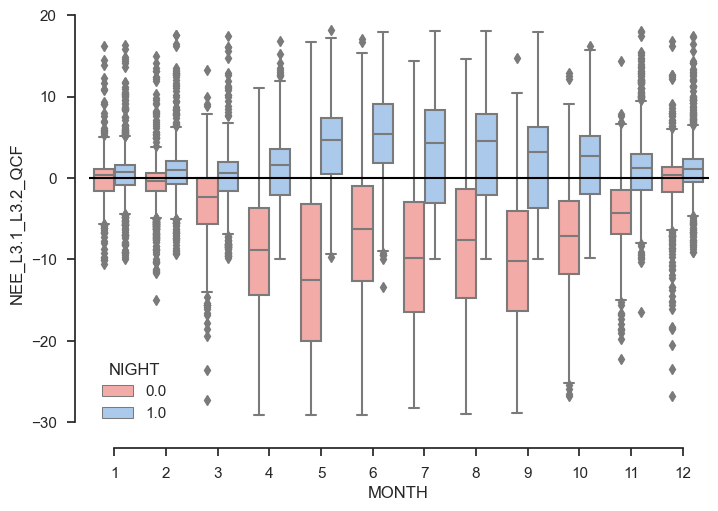

In [88]:
# Draw boxplots
sns.set_theme(style="ticks", palette="pastel")
sns.boxplot(x="MONTH", y=FLUXVAR32QCF, palette=["r", "b"], hue="NIGHT", data=boxplots_df)
sns.despine(offset=10, trim=True)
plt.axhline(0, color="black");

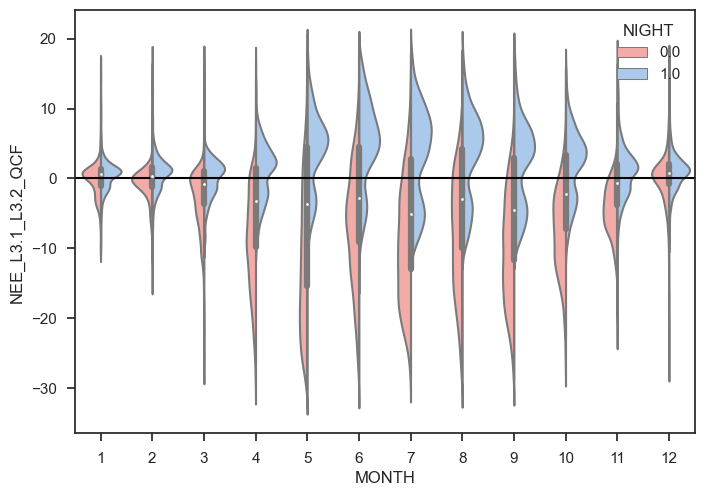

In [89]:
# Draw a nested violinplot and split the violins for easier comparison
sns.violinplot(data=boxplots_df, x="MONTH", y=FLUXVAR32QCF, hue="NIGHT", split=True, palette=["r", "b"]);
plt.axhline(0, color="black");

</br>

# **Save results to file**
- Save results to file for futher processing
- This can be useful if you want to use the data in another software, e.g. continuing post-processing using the library `ReddyProc` in `R` 
- `Parquet` format is recommended for large datasets

## Option 1: Save to CSV (large and slow)

In [ ]:
df_level32_qcf.to_csv("mylovelyhorse.csv")

## Option 2: Save to Parquet (small and fast)
- Needed if you want to continue post-processing in notebooks
- Can also be used in `R` with the `arrow` package

In [ ]:
save_parquet(data=df_level32_qcf, filename="df_level32_qcf")

</br>

# *(Preliminary) USTAR*

<div class="alert alert-block alert-danger">
    No USTAR filtering for: <b>H, LE, ET and FH2O.</b> 
</div>

> The USTAR filtering is not applied to H and LE, because it has not been proved that when there are CO2 advective fluxes, these also impact energy fluxes, specifically due to the fact that when advection is in general large (nighttime), energy fluxes are small.

source: [Pastorello et al. (2020). The FLUXNET2015 dataset and the ONEFlux processing pipeline for eddy covariance data](https://doi.org/10.1038/s41597-020-0534-3)



## *(Preliminary) Impact of different USTAR thresholds on data availability*



[UstarThresholdConstantScenarios]  ========================================
[UstarThresholdConstantScenarios]  UstarThresholdConstantScenarios
[UstarThresholdConstantScenarios]  ========================================
[UstarThresholdConstantScenarios]  Done.
[UstarThresholdConstantScenarios]  ________________________________________


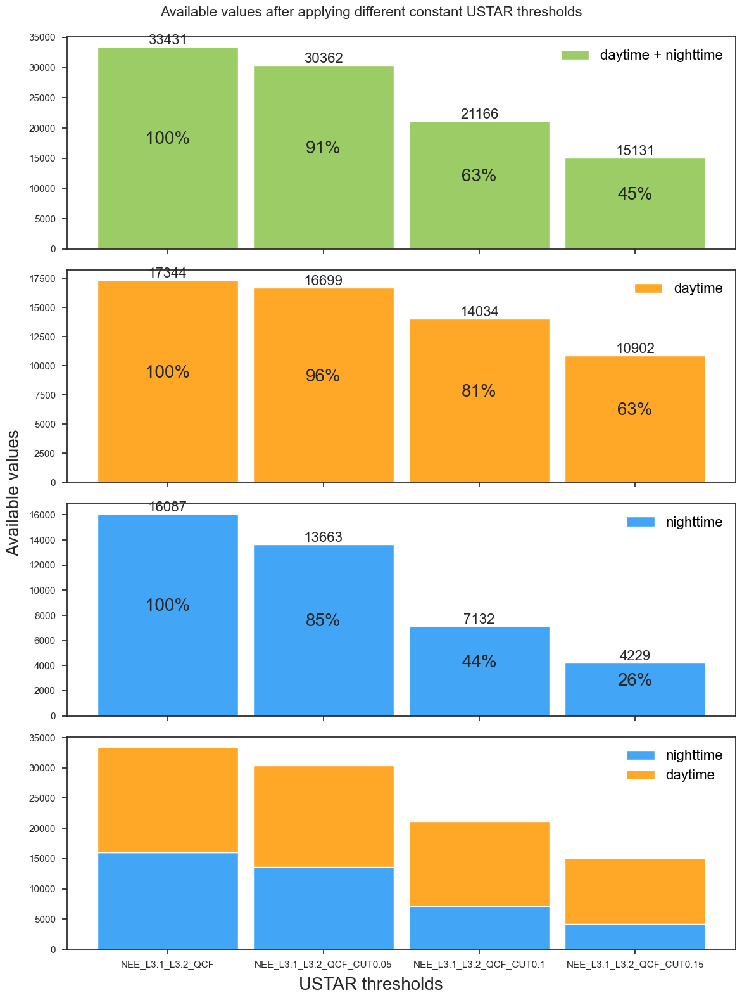

In [90]:
from diive.pkgs.flux.ustarthreshold import UstarThresholdConstantScenarios
ust = UstarThresholdConstantScenarios(series=df_level32_qcf[FLUXVAR32QCF],
                                      swinpot=df_level32_qcf['SW_IN_POT'],
                                      ustar=df_level32_qcf['USTAR'])
ust.calc(ustarthresholds=[0.05, 0.1, 0.15], showplot=True, verbose=True)

## *(Preliminary) Apply constant USTAR threshold*
- Use constant USTAR threshold for all data

(TODO)

</br>

# **End of notebook**
Congratulations, you reached the end of this notebook! Before you go let's store your finish time.

In [77]:
dt_string = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
print(f"Finished. {dt_string}")

Finished. 2023-10-31 11:46:48
